<div style="display: flex; background-color:rgb(214, 234, 248 );" >
<h1 style="text-align: center;margin: auto; padding: 40px; ">Analysez les ventes d'une librairie avec Python
    </h1>
    <p >  
      
</p>
      
  
</div>

# Notebook 2

<a name="top"></a>

# Sommaire :


**Partie 1**
 - <a href="#C1">Importation des libraries</a>

 - <a href="#C2">Importation des données propres</a>
 
**Partie 2 : Première Mission (Les demandes d'Antoine)**
 - <a href="#C3"> 2.1 Différents indicateurs et graphiques autour du chiffre d'affaires</a>
 - <a href="#C4"> 2.2.a L’évolution de CA dans le temps par mois et par jour (Total et par Catégorie)</a>
 - <a href="#C5"> 2.2.b Une décomposition de CA en moyenne mobile pour évaluer la tendance globale (Total et par Catégorie) </a>
 - <a href="#C6"> 2.2.c Moyen Mobile de CA par mois et par jour (Total et par Catégorie)</a>
 - <a href="#C7"> 2.3 Un zoom sur les références, pour voir un peu les tops et les flops, la répartition par catégorie
</a>
 - <a href="#C8"> 2.4 Quelques informations sur les profils des clients et la répartition du CA entre eux</a>
 
 
**Partie 3 : Deuxième Mission (Les demandes de Julie)**
 - <a href="#C16"> Analyse de distribution gaussien normal</a>
 - <a href="#C9">  3.1 Le lien entre le genre d’un client et les catégories des livres achetés</a>
 - <a href="#C10"> 3.2 Le lien entre l’âge des clients et le montant total des achats</a>
 - <a href="#C11"> 3.3 Le lien entre l’âge des clients et la fréquence d’achat</a>
 - <a href="#C12"> 3.4 Le lien entre l’âge des clients et la taille du panier moyen</a>
 - <a href="#C13"> 3.5 Le lien entre l’âge des clients et les catégories des livres achetés</a>
 
 
**Partie 4 : Une analyse supplémentaire**
 - <a href="#C14"> Le lien entre le genre d’un client et la taille du panier moyen</a>
 
**Partie 5 : Conclusion**
 - <a href="#C15">Conclusion </a>



# <a name="C1">Importation des libraries</a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as st
import seaborn as sns
import datetime as dt
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import chi2_contingency
from scipy.stats import spearmanr
from scipy import stats
import warnings                                  
warnings.filterwarnings('ignore')

# <a name="C2">Importation des données propres</a>

In [2]:
products_new= pd.read_csv("products_new.csv")
customers_new= pd.read_csv("customers_new.csv")
transactions_new= pd.read_csv("transactions_new.csv")
merge_sans_octobre=pd.read_csv("merge_sans_octobre.csv")

In [3]:
products_new.head()

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0
3,1_587,4.99,1
4,0_1507,3.99,0


In [4]:
products_new.shape

(3287, 3)

In [5]:
merge_sans_octobre.head()

,client_id,sex,birth,age,cat_age,id_prod,price,categ,session_id,date_jour,date_mois
0,c_4410,f,1967,56,moyen-age 45-60,1_385,25.99,1,s_9707,2021-03-22,2021-03-01
1,c_4410,f,1967,56,moyen-age 45-60,1_385,25.99,1,s_345108,2023-02-22,2023-02-01
2,c_4410,f,1967,56,moyen-age 45-60,0_1110,4.71,0,s_114715,2021-11-04,2021-11-01
3,c_4410,f,1967,56,moyen-age 45-60,0_1111,19.99,0,s_345108,2023-02-22,2023-02-01
4,c_4410,f,1967,56,moyen-age 45-60,0_1111,19.99,0,s_9707,2021-03-22,2021-03-01


In [6]:
merge_sans_octobre.shape

(657726, 11)

# Premier Mission (Les demandes d'Antoine)

#  <a name="C3"> 2.1 Différents indicateurs et graphiques autour du chiffre d'affaires</a>

<a href="#top">sommaire</a>
 

In [7]:
ca_total = merge_sans_octobre["price"].sum()
round(ca_total,2)

11535440.16

In [8]:
# ca par catégorie

ca_par_categ= merge_sans_octobre.groupby("categ")["price"].sum()
ca_par_categ

categ
0    4222990.36
1    4619960.37
2    2692489.43
Name: price, dtype: float64

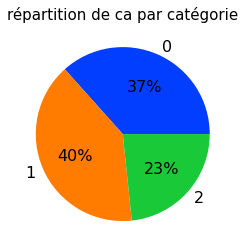

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
labels = ca_par_categ.index
colors = sns.color_palette('bright')
plt.pie(ca_par_categ, labels=labels,colors = colors, textprops = {'color': 'black','fontsize':16}, autopct = '%0.0f%%')
plt.title("répartition de ca par catégorie",size=15)
#plt.savefig("P6_image/dispertion_ca_categ.png")
plt.show()

# <a name="C4"> 2.2.a- L’évolution de CA dans le temps par mois et par jour (Total et par Catégorie)</a>
<a href="#top">sommaire</a>

In [10]:
# Ca total par mois
ca_mois=merge_sans_octobre.groupby("date_mois")["price"].sum()
ca_mois.head()

date_mois
2021-03-01    482546.18
2021-04-01    476273.52
2021-05-01    493037.31
2021-06-01    484170.67
2021-07-01    482882.32
Name: price, dtype: float64

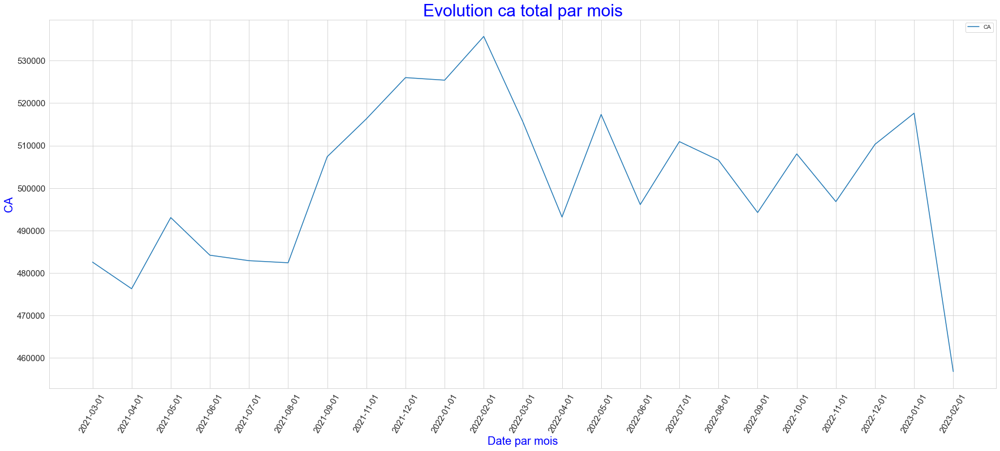

In [11]:
data=ca_mois
sns.set_style("whitegrid")
font1 = {'color':'blue','size':30}
font2 = {'color':'blue','size':20}
plt.figure(figsize = (30,12))
plt.title("Evolution ca total par mois",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)
sns.lineplot(data =data, x = data.index, y=data.values, label="CA")
plt.savefig("P6_image/evolution_ca_total_mois.png");


In [12]:
# On constate une augmentation de ca jusqu'à Février 2022 mais après cette date il y a une baisse

In [13]:
# Ca total par jour

ca_jour=merge_sans_octobre.groupby("date_jour")["price"].sum()
ca_jour.head()

date_jour
2021-03-01    16576.95
2021-03-02    15498.18
2021-03-03    15198.69
2021-03-04    15196.07
2021-03-05    17471.37
Name: price, dtype: float64

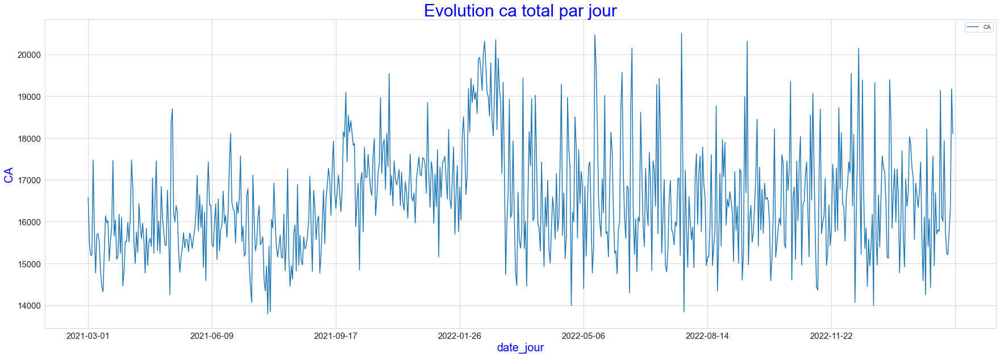

In [14]:
# Ca total par jour
font1 = {'color':'blue','size':30}
font2 = {'color':'blue','size':20}
plt.figure(figsize = (30,10))
plt.title("Evolution ca total par jour",fontdict = font1)
plt.xlabel("Date par jour", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)
sns.set_style("whitegrid")
ca_jour.plot(linewidth=1.5,legend='brief', label="CA")
plt.savefig("P6_image/evolution_ca_total_jour.png");


In [15]:
# ca pour categorie 0 par mois
ca_par_mois_c0=merge_sans_octobre[merge_sans_octobre["categ"]==0].groupby("date_mois")["price"].sum()
ca_par_mois_c0.head()

date_mois
2021-03-01    193734.74
2021-04-01    205386.68
2021-05-01    196280.56
2021-06-01    168025.26
2021-07-01    144797.71
Name: price, dtype: float64

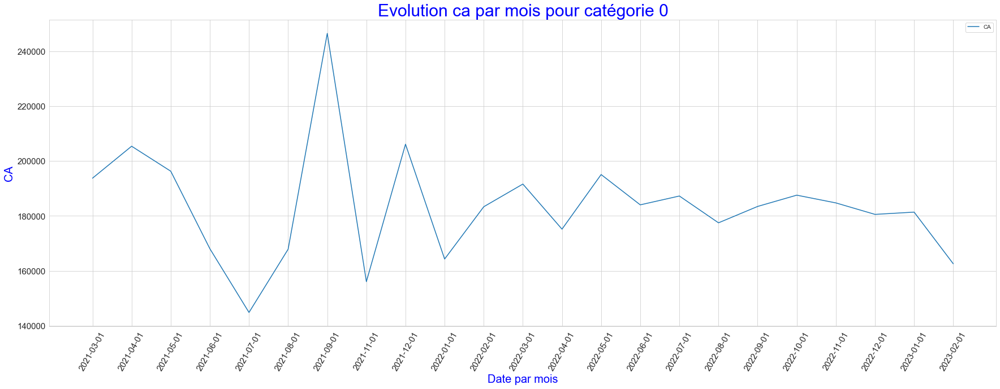

In [16]:
# ca pour categorie 0 par mois
data=ca_par_mois_c0

font1 = {'color':'blue','size':30}
font2 = {'color':'blue','size':20}

plt.figure(figsize = (30,10))
plt.title("Evolution ca par mois pour catégorie 0",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)
sns.lineplot(data =data, x = data.index, y=data.values, label="CA");



In [17]:
# ca pour categorie 0 par jour

ca_par_jour_c0=merge_sans_octobre[merge_sans_octobre["categ"]==0].groupby("date_jour")["price"].sum()
ca_par_jour_c0

date_jour
2021-03-01    6274.38
2021-03-02    6730.00
2021-03-03    6121.03
2021-03-04    5891.48
2021-03-05    5975.97
               ...   
2023-02-24    6197.92
2023-02-25    4942.69
2023-02-26    5522.90
2023-02-27    7437.43
2023-02-28    4901.86
Name: price, Length: 699, dtype: float64

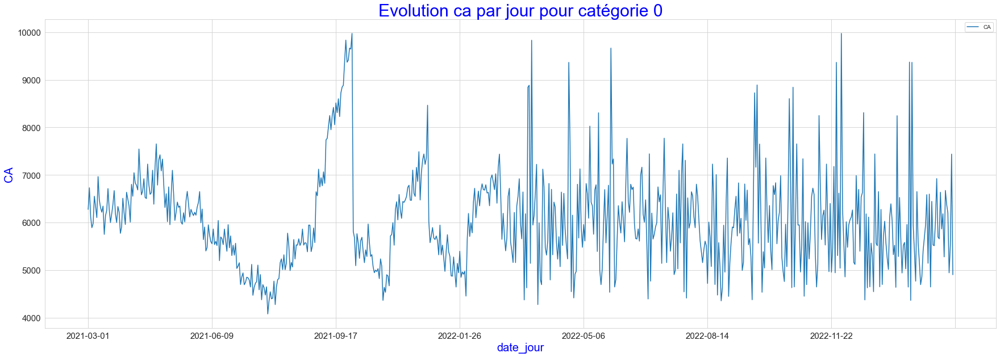

In [18]:
# ca pour categorie 0 par jour

font1 = {'color':'blue','size':30}
font2 = {'color':'blue','size':20}
plt.figure(figsize = (30,10))
plt.title("Evolution ca par jour pour catégorie 0",fontdict = font1)
plt.xlabel("Date par jour", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)
sns.set_style("whitegrid")
ca_par_jour_c0.plot(linewidth=1.5,legend='brief', label="CA");


In [19]:
# ca pour categorie 1 par mois
ca_par_mois_c1=merge_sans_octobre[merge_sans_octobre["categ"]==1].groupby("date_mois")["price"].sum()
ca_par_mois_c1.head()

date_mois
2021-03-01    186974.17
2021-04-01    156138.35
2021-05-01    165893.40
2021-06-01    189162.04
2021-07-01    188523.27
Name: price, dtype: float64

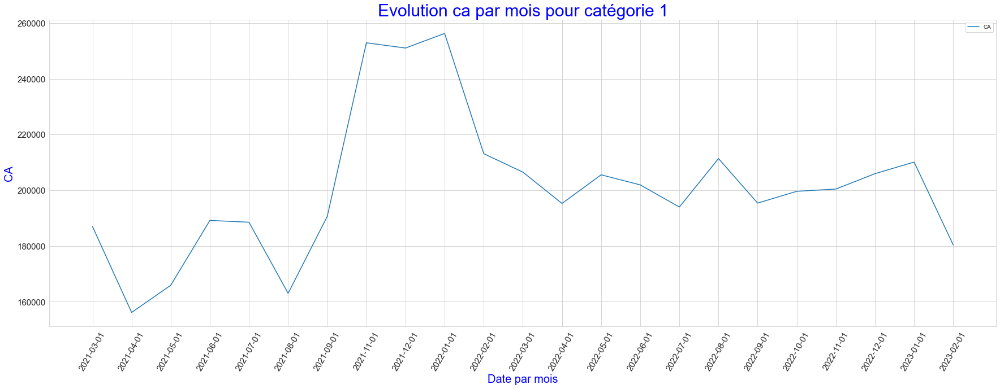

In [20]:
# ca pour categorie 1 par mois
data=ca_par_mois_c1

font1 = {'color':'blue','size':30}
font2 = {'color':'blue','size':20}
plt.figure(figsize = (30,10))
plt.title("Evolution ca par mois pour catégorie 1",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)

sns.lineplot(data =data, x = data.index, y=data.values,label="CA");


In [21]:
# ca pour categorie 1 par jour
ca_par_jour_c1=merge_sans_octobre[merge_sans_octobre["categ"]==1].groupby("date_jour")["price"].sum()
ca_par_jour_c1

date_jour
2021-03-01    6811.53
2021-03-02    5627.15
2021-03-03    5691.41
2021-03-04    6098.98
2021-03-05    7071.21
               ...   
2023-02-24    5471.07
2023-02-25    8050.61
2023-02-26    7009.09
2023-02-27    6461.76
2023-02-28    9226.25
Name: price, Length: 699, dtype: float64

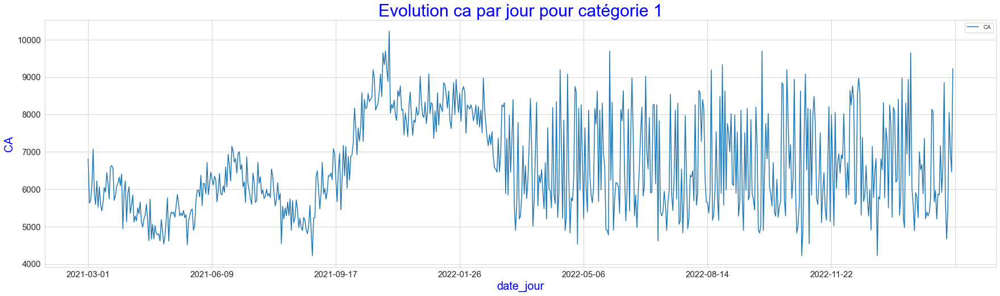

In [22]:
# ca pour categorie 1 par jour
font1 = {'color':'blue','size':30}
font2 = {'color':'blue','size':20}
plt.title("Evolution ca par jour pour catégorie 1",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(size=15)
plt.yticks(size=15)
sns.set_style("whitegrid")
ca_par_jour_c1.plot(linewidth=1.5, figsize=(30, 8),legend='brief', label="CA")
plt.savefig("P6_image/evolution_ca_jour_categ1.png");

In [23]:
# Après mars 2022 il y a un changement d'oscilation.
# On peut considérer que la différence entre deux ca par jour a augmenté 

In [24]:
# ca pour categorie 2 par mois
ca_par_mois_c2=merge_sans_octobre[merge_sans_octobre["categ"]==2].groupby("date_mois")["price"].sum()
ca_par_mois_c2.head()

date_mois
2021-03-01    101837.27
2021-04-01    114748.49
2021-05-01    130863.35
2021-06-01    126983.37
2021-07-01    149561.34
Name: price, dtype: float64

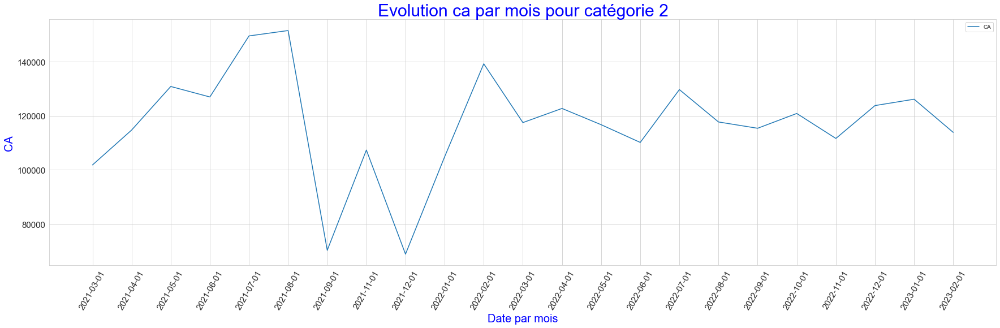

In [25]:
# ca pour categorie 2 par mois
data=ca_par_mois_c2

font1 = {'color':'blue','size':30}
font2 = {'color':'blue','size':20}
plt.figure(figsize = (30,8))
plt.title("Evolution ca par mois pour catégorie 2",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)
sns.lineplot(data =data, x = data.index, y=data.values,label="CA");

In [26]:
# On constate une forte baisse de chiffre d'affaires dans les dates Septembre et Décembre 2021
# Le ca est plutôt stable après Février 2022

In [27]:
# ca pour categorie 2 par jour
ca_par_jour_c2=merge_sans_octobre[merge_sans_octobre["categ"]==2].groupby("date_jour")["price"].sum()
ca_par_jour_c2

date_jour
2021-03-01    3491.04
2021-03-02    3141.03
2021-03-03    3386.25
2021-03-04    3205.61
2021-03-05    4424.19
               ...   
2023-02-24    3538.90
2023-02-25    2767.95
2023-02-26    3772.73
2023-02-27    5271.62
2023-02-28    3977.04
Name: price, Length: 699, dtype: float64

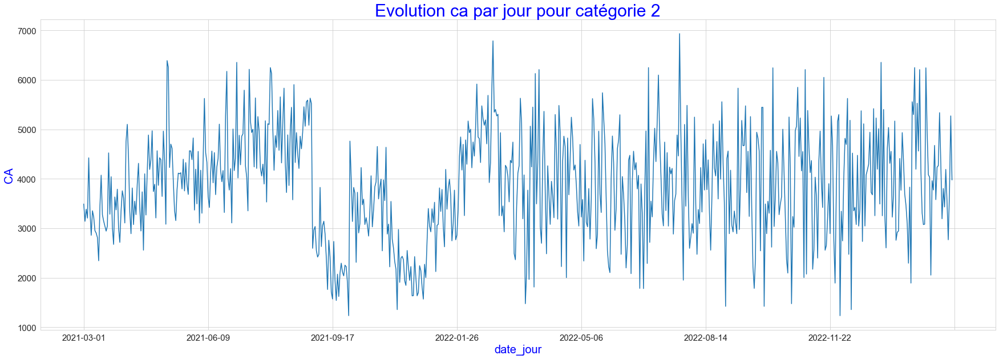

In [28]:
# ca pour categorie 2 par jour
font1 = {'color':'blue','size':30}
font2 = {'color':'blue','size':20}
plt.figure(figsize = (30,10))
plt.title("Evolution ca par jour pour catégorie 2",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)
sns.set_style("whitegrid")
ca_par_jour_c2.plot(linewidth=1.5,label="CA");


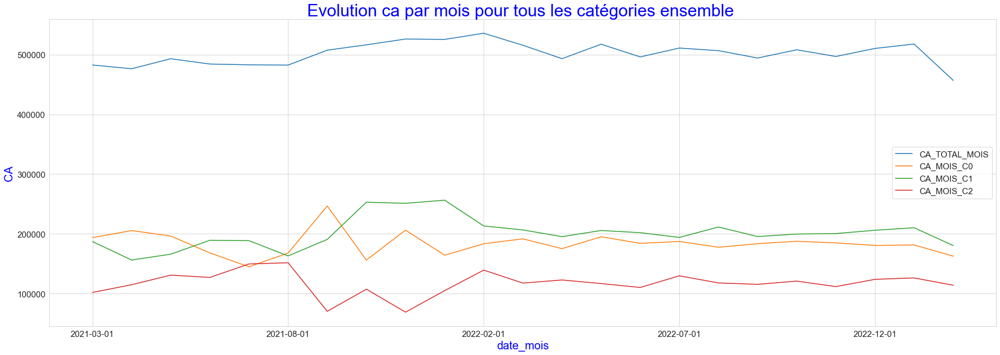

In [29]:

ca_mois=ca_mois.rename("CA_TOTAL_MOIS")
ca_par_mois_c0=ca_par_mois_c0.rename("CA_MOIS_C0")
ca_par_mois_c1=ca_par_mois_c1.rename("CA_MOIS_C1")
ca_par_mois_c2=ca_par_mois_c2.rename("CA_MOIS_C2")

font1 = {'color':'blue','size':30}
font2 = {'color':'blue','size':20}

plt.figure(figsize = (30,10))
plt.title("Evolution ca par mois pour tous les catégories ensemble ",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(size=15)
plt.yticks(size=15)

ca_mois.plot(figsize=(30,10),legend = True)
ca_par_mois_c0.plot(legend = True)
ca_par_mois_c1.plot(legend = True)
ca_par_mois_c2.plot(legend = True)
plt.legend( fontsize='15',loc='center right')
plt.savefig("P6_image/evolution_ca_mois_all.png");


In [30]:
# On constate que quand le ca de catégorie 0 augment le ca de catégorie de 2 baisse
# Peut etre les clients achetent un produit qui est en rupture dans un  catég ils changent leur choix avec un autre produit dans l'autre catégorie 

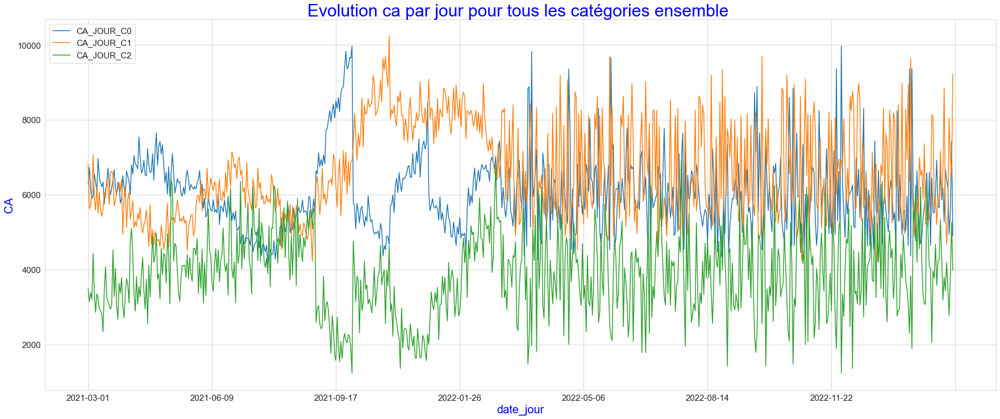

In [31]:
ca_jour=ca_jour.rename("CA_TOTAL_JOUR")
ca_par_jour_c0=ca_par_jour_c0.rename("CA_JOUR_C0")
ca_par_jour_c1=ca_par_jour_c1.rename("CA_JOUR_C1")
ca_par_jour_c2=ca_par_jour_c2.rename("CA_JOUR_C2")

font1 = {'color':'blue','size':30}
font2 = {'color':'blue','size':20}

plt.figure(figsize = (30,12))
plt.title("Evolution ca par jour pour tous les catégories ensemble ",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)

#ca_mois.plot(figsize=(30,10),legend = True)
ca_par_jour_c0.plot(legend = True)
ca_par_jour_c1.plot(legend = True)
ca_par_jour_c2.plot(legend = True)
plt.legend( fontsize='15',loc='upper left')
plt.savefig("P6_image/evolution_ca_jour_all.png");


#  <a name="C5">    2.2.b- Une décomposition de CA en moyenne mobile pour évaluer la tendance globale(Total et par Catégorie) </a>

<a href="#top">sommaire</a>

In [32]:
ca_mois.head()

date_mois
2021-03-01    482546.18
2021-04-01    476273.52
2021-05-01    493037.31
2021-06-01    484170.67
2021-07-01    482882.32
Name: CA_TOTAL_MOIS, dtype: float64

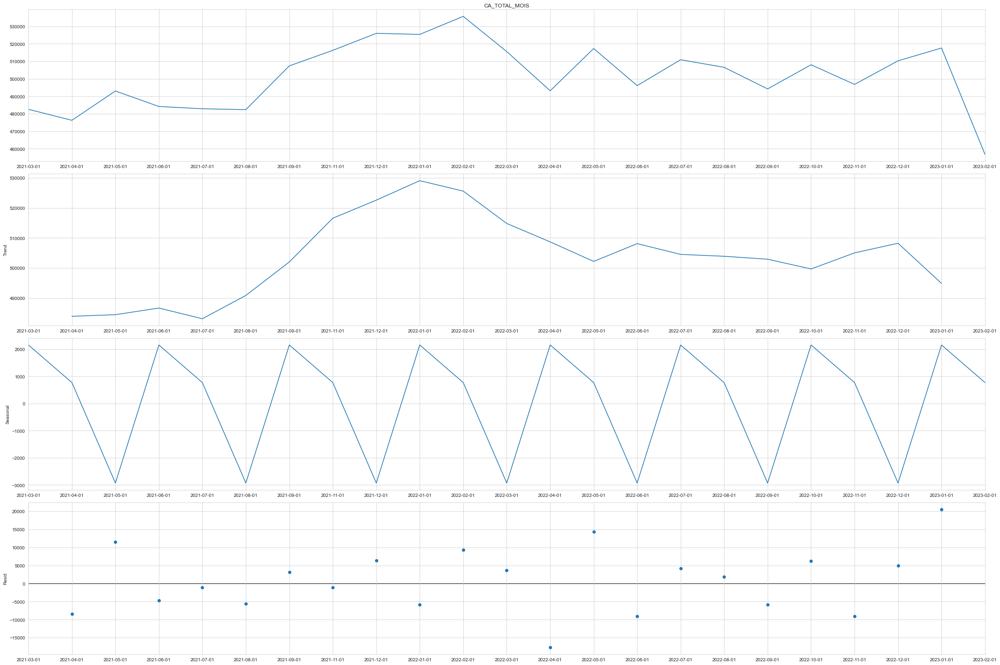

In [33]:
# decomposition ca total par mois

from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
plt.rcParams.update({"figure.figsize":(30,20)})
decomp_ca_mois = seasonal_decompose(ca_mois,  model='additive',period=3)
decomp_ca_mois.plot()
plt.show()

In [34]:
seasonal_mois=decomp_ca_mois.seasonal
residu_mois=decomp_ca_mois.resid
trend_mois=decomp_ca_mois.trend
decomp_ca_mois_csv=ca_mois-seasonal_mois

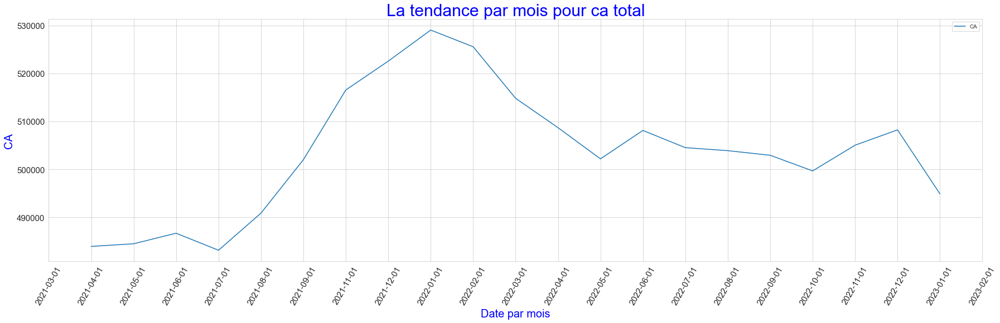

In [35]:
plt.figure(figsize = (30,8))
plt.title("La tendance par mois pour ca total",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)
data=trend_mois
sns.lineplot(data =data, x = data.index, y=data.values,label="CA")
plt.savefig("P6_image/tendance_ca_mois.png");


In [36]:
# D'après le graphique de la tendance, jusqu'a Janvier 2022 il y a une augmentation de ca.
# Mais après cette date on constate une baisse de ca

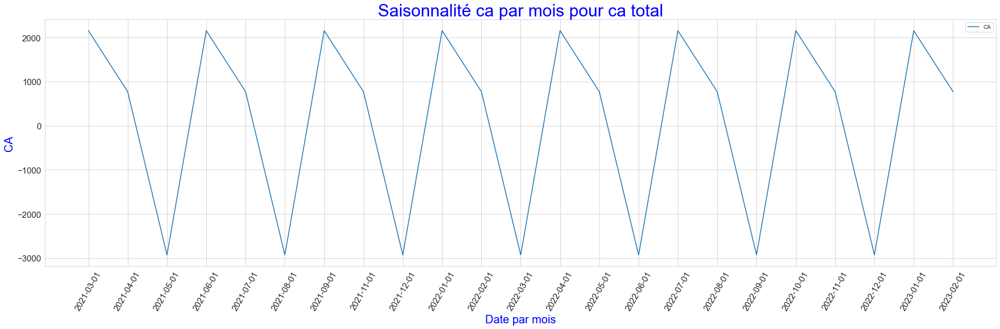

In [37]:
plt.figure(figsize = (30,8))
plt.title("Saisonnalité ca par mois pour ca total",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)
data=seasonal_mois
sns.lineplot(data =data, x = data.index, y=data.values,label="CA")
plt.savefig("P6_image/saisonnalité_ca_mois.png");


In [38]:
# Si on analyse la saisonnalité trimestrielle on constate un mois de augmentation de ca mais deux de mois de baisse.
# On peut s'intérogger sois une rupture de stock sois une mauvaise gestion de stock ?

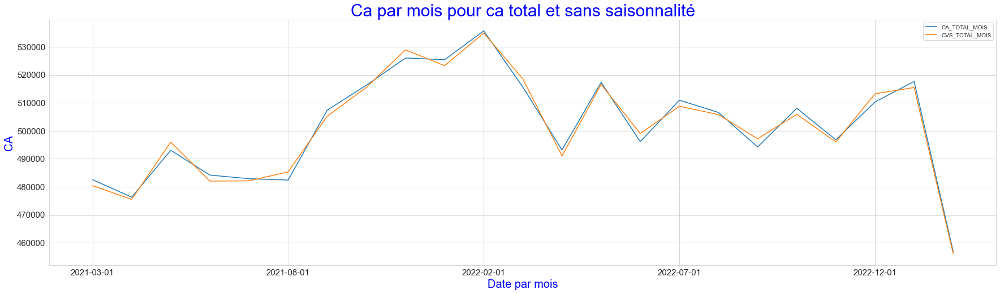

In [39]:
ca_mois=ca_mois.rename("CA_TOTAL_MOIS")
decomp_ca_mois_csv=decomp_ca_mois_csv.rename("CVS_TOTAL_MOIS")
ca_mois.plot(figsize=(30,8),legend = True)
decomp_ca_mois_csv.plot(legend = True)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(size=15)
plt.yticks(size=15)
plt.title("Ca par mois pour ca total et sans saisonnalité",fontdict = font1)
plt.savefig("P6_image/ensemble_ca_mois.png");

In [40]:
ca_par_jour=ca_jour
ca_par_jour.head()

date_jour
2021-03-01    16576.95
2021-03-02    15498.18
2021-03-03    15198.69
2021-03-04    15196.07
2021-03-05    17471.37
Name: CA_TOTAL_JOUR, dtype: float64

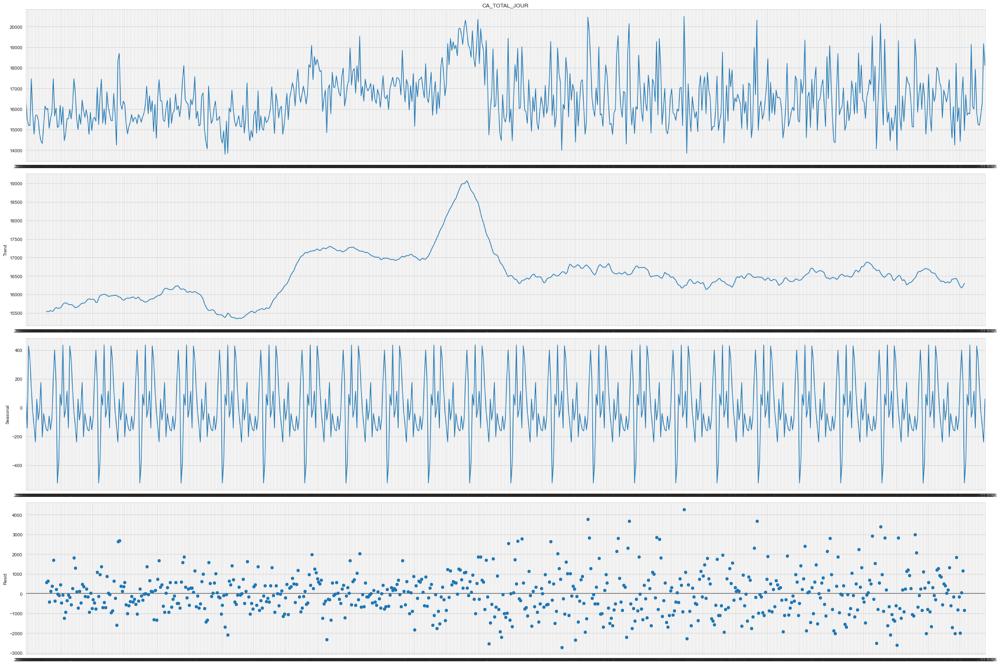

In [41]:
# decomposition ca total par jour

from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

plt.rcParams.update({"figure.figsize":(30,20)})

decomp_ca_par_jour = seasonal_decompose(ca_par_jour,  model='additive',period=30)

decomp_ca_par_jour.plot()

plt.show()

In [42]:
seasonal_par_jour=decomp_ca_par_jour.seasonal
residu_par_jour=decomp_ca_par_jour.resid
trend_par_jour=decomp_ca_par_jour.trend
decomp_ca_par_jour_csv=ca_par_jour-seasonal_par_jour

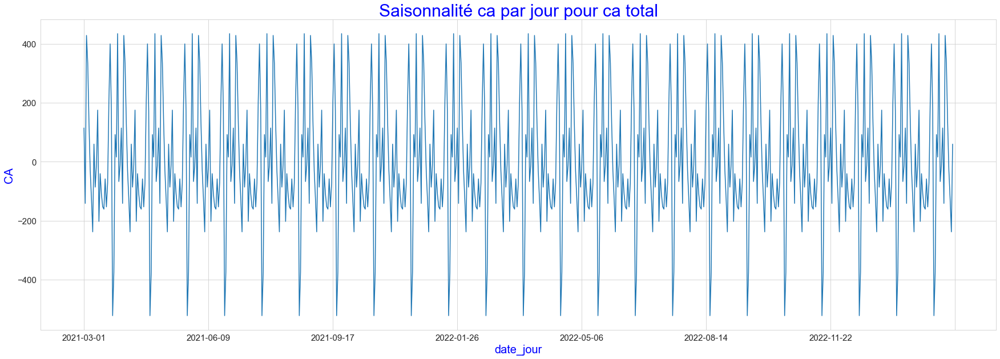

In [43]:
plt.figure(figsize = (30,10))
plt.title("Saisonnalité ca par jour pour ca total",fontdict = font1)
plt.xlabel("Date par jour", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)

seasonal_par_jour.plot();


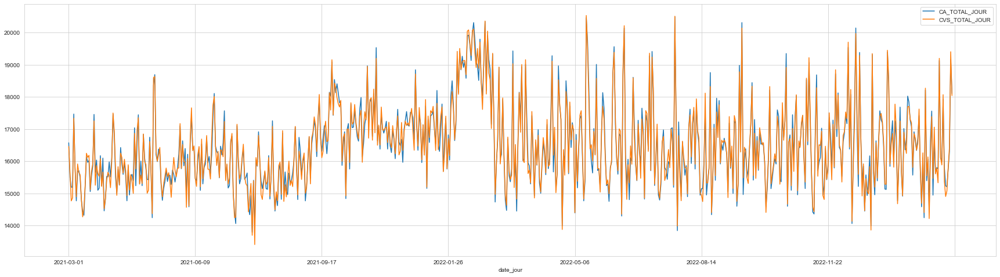

In [44]:
ca_par_jour=ca_par_jour.rename("CA_TOTAL_JOUR")
decomp_ca_par_jour_csv=decomp_ca_par_jour_csv.rename("CVS_TOTAL_JOUR")
ca_par_jour.plot(figsize=(30,8),legend = True)
decomp_ca_par_jour_csv.plot(legend = True);

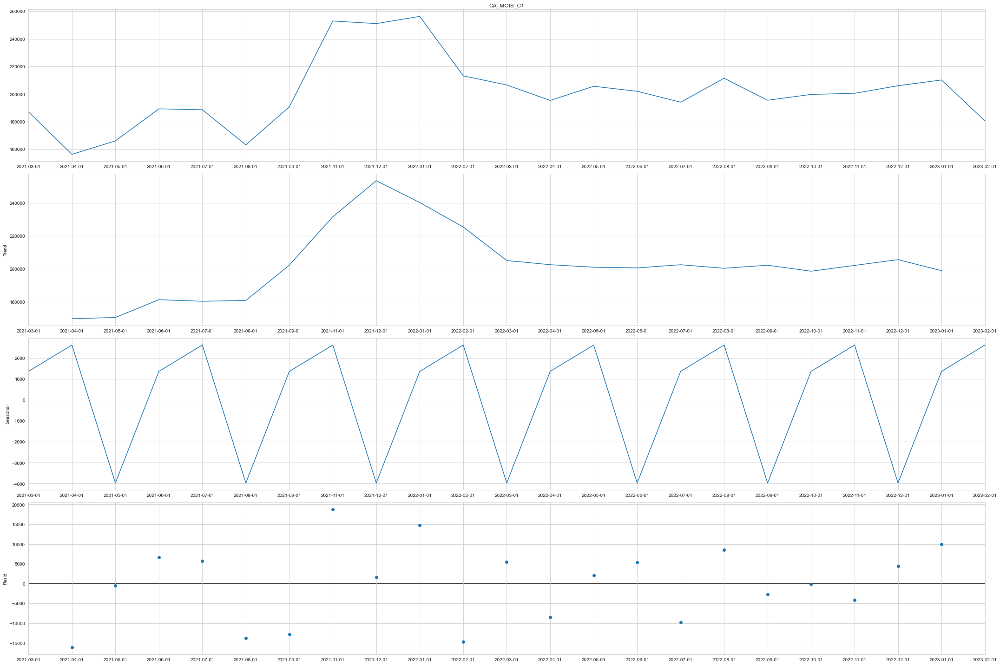

In [45]:
# decomposition ca par mois pour categorie 1 

from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

plt.rcParams.update({"figure.figsize":(30,20)})

decomp_ca_mois_c1 = seasonal_decompose(ca_par_mois_c1,  model='additive',period=3)

decomp_ca_mois_c1.plot()

plt.show()

In [46]:
seasonal_mois_c1=decomp_ca_mois_c1.seasonal
residu_mois_c1=decomp_ca_mois_c1.resid
trend_mois_c1=decomp_ca_mois_c1.trend
decomp_ca_mois_c1_csv=ca_par_mois_c1-seasonal_mois_c1

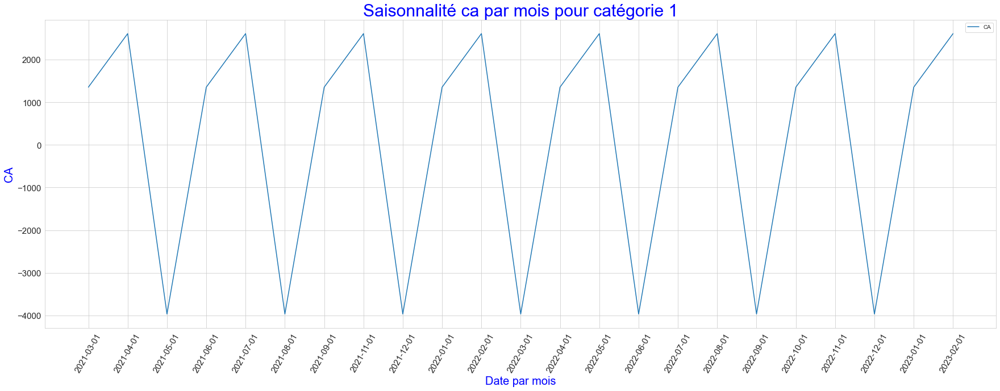

In [47]:
plt.figure(figsize = (30,10))
plt.title("Saisonnalité ca par mois pour catégorie 1",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)

data=seasonal_mois_c1
sns.lineplot(data =data, x = data.index, y=data.values,label="CA");


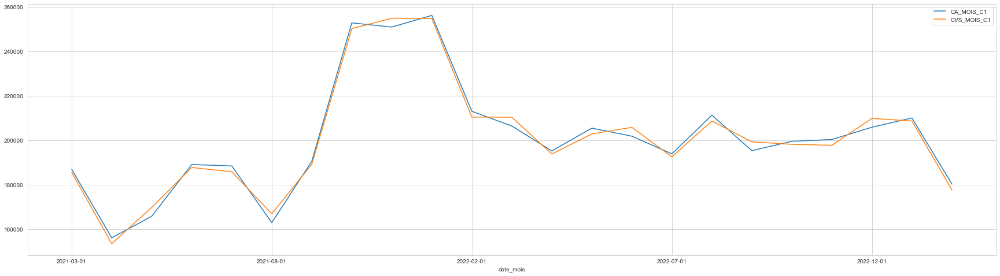

In [48]:
ca_par_mois_c1=ca_par_mois_c1.rename("CA_MOIS_C1")
decomp_ca_mois_c1_csv=decomp_ca_mois_c1_csv.rename("CVS_MOIS_C1")
ca_par_mois_c1.plot(figsize=(30,8),legend = True)
decomp_ca_mois_c1_csv.plot(legend = True);


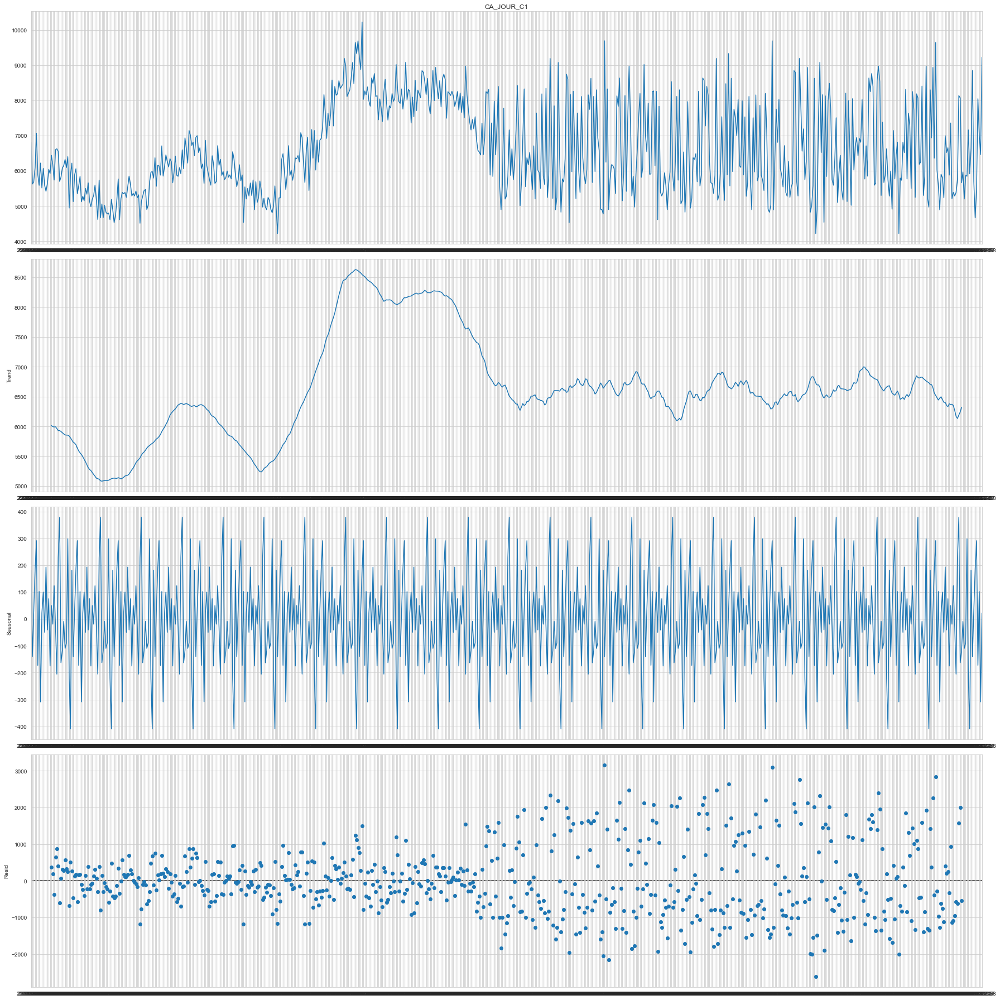

In [49]:
# decompostion ca par jour pour categorie 1 

from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
plt.rcParams.update({"figure.figsize":(25,25)})
decomp_ca_par_jour_c1 = seasonal_decompose(ca_par_jour_c1,  model='additive',period=30)
decomp_ca_par_jour_c1.plot()

plt.show()

In [50]:
seasonal_par_jour_c1=decomp_ca_par_jour_c1.seasonal
residu_par_jour_c1=decomp_ca_par_jour_c1.resid
trend_par_jour_c1=decomp_ca_par_jour_c1.trend
decomp_ca_par_jour_c1_csv=ca_par_jour_c1-seasonal_par_jour_c1


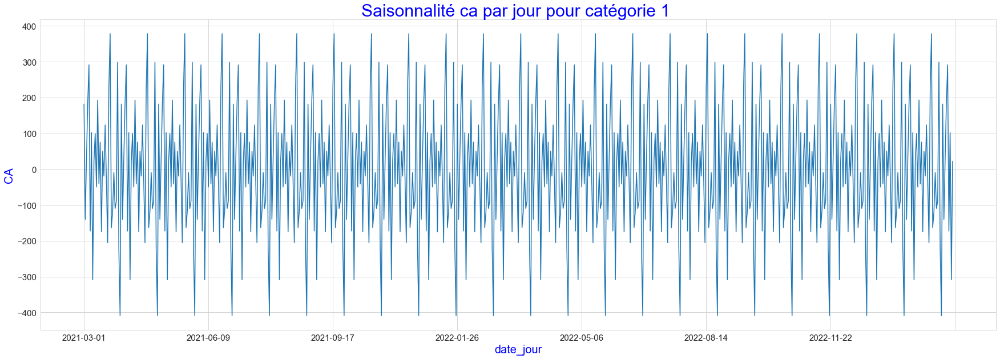

In [51]:
plt.figure(figsize = (30,10))
plt.title("Saisonnalité ca par jour pour catégorie 1 ",fontdict = font1)
plt.xlabel("Date par jour", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)
seasonal_par_jour_c1.plot();


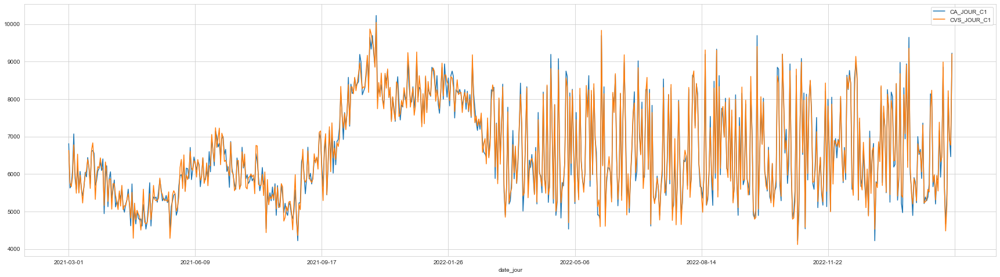

In [52]:
ca_par_jour_c1=ca_par_jour_c1.rename("CA_JOUR_C1")
decomp_ca_par_jour_c1_csv=decomp_ca_par_jour_c1_csv.rename("CVS_JOUR_C1")
ca_par_jour_c1.plot(figsize=(30,8),legend = True)
decomp_ca_par_jour_c1_csv.plot(legend = True);

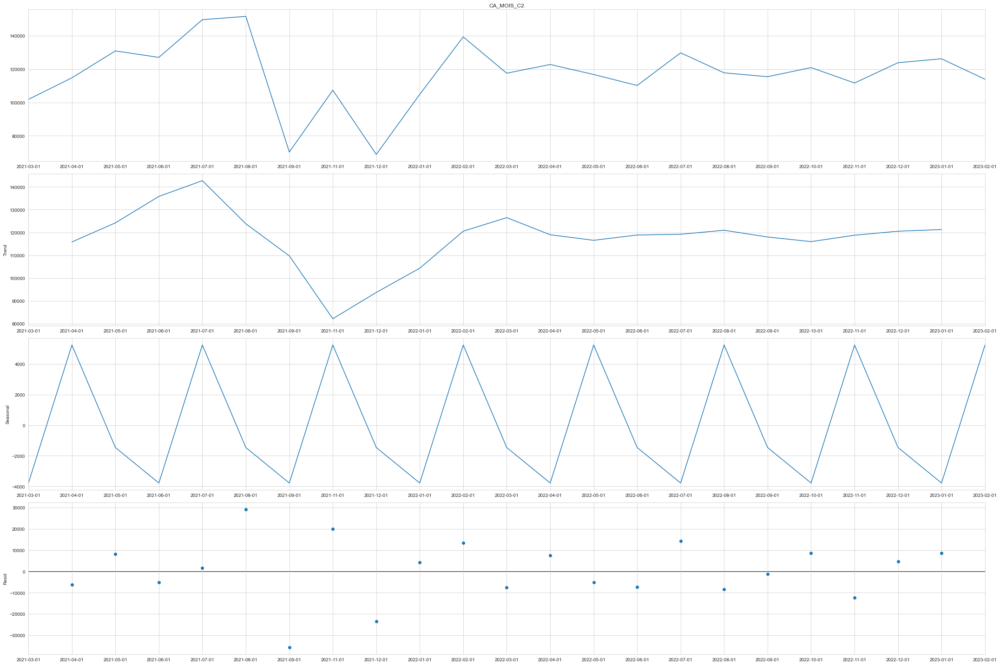

In [53]:
# decomposition ca par mois pour categorie 2 

from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

plt.rcParams.update({"figure.figsize":(30,20)})

decomp_ca_mois_c2 = seasonal_decompose(ca_par_mois_c2,  model='additive',period=3)

decomp_ca_mois_c2.plot()

plt.show()

In [54]:
seasonal_mois_c2=decomp_ca_mois_c2.seasonal
residu_mois_c2=decomp_ca_mois_c2.resid
trend_mois_c2=decomp_ca_mois_c2.trend
decomp_ca_mois_c2_csv=ca_par_mois_c2-seasonal_mois_c2

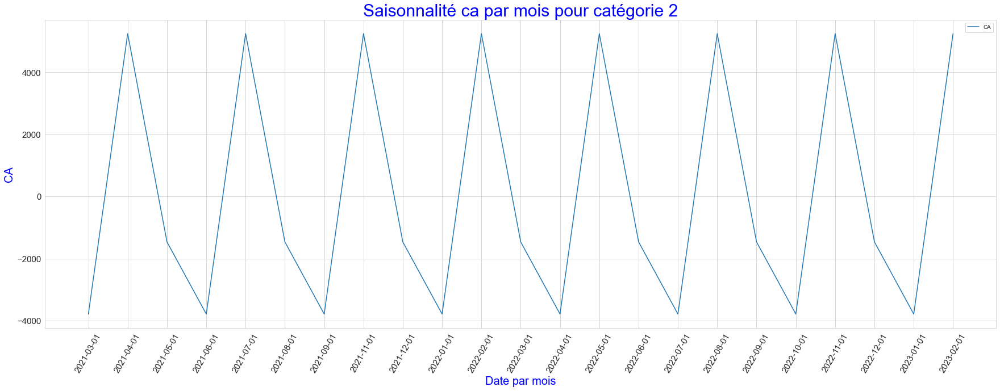

In [55]:
plt.figure(figsize = (30,10))
plt.title("Saisonnalité ca par mois pour catégorie 2",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)

data=seasonal_mois_c2
sns.lineplot(data =data, x = data.index, y=data.values,label="CA");


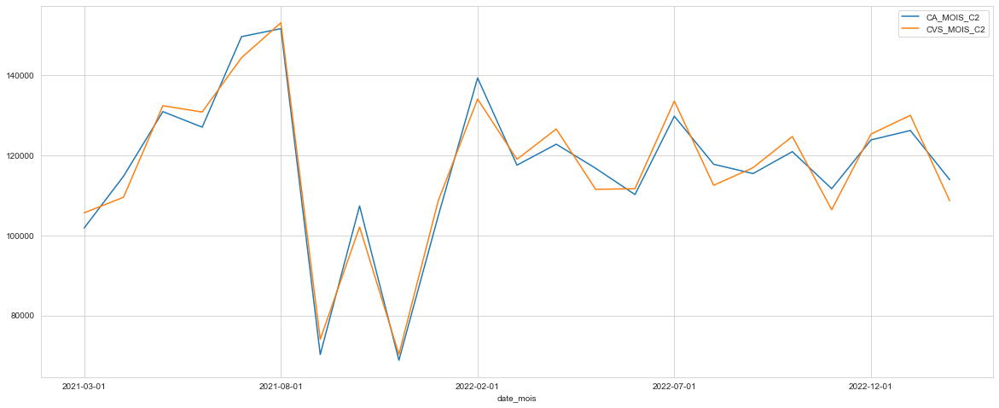

In [56]:
ca_par_mois_c2=ca_par_mois_c2.rename("CA_MOIS_C2")
decomp_ca_mois_c2_csv=decomp_ca_mois_c2_csv.rename("CVS_MOIS_C2")
ca_par_mois_c2.plot(figsize=(20,8),legend = True)
decomp_ca_mois_c2_csv.plot(legend = True);


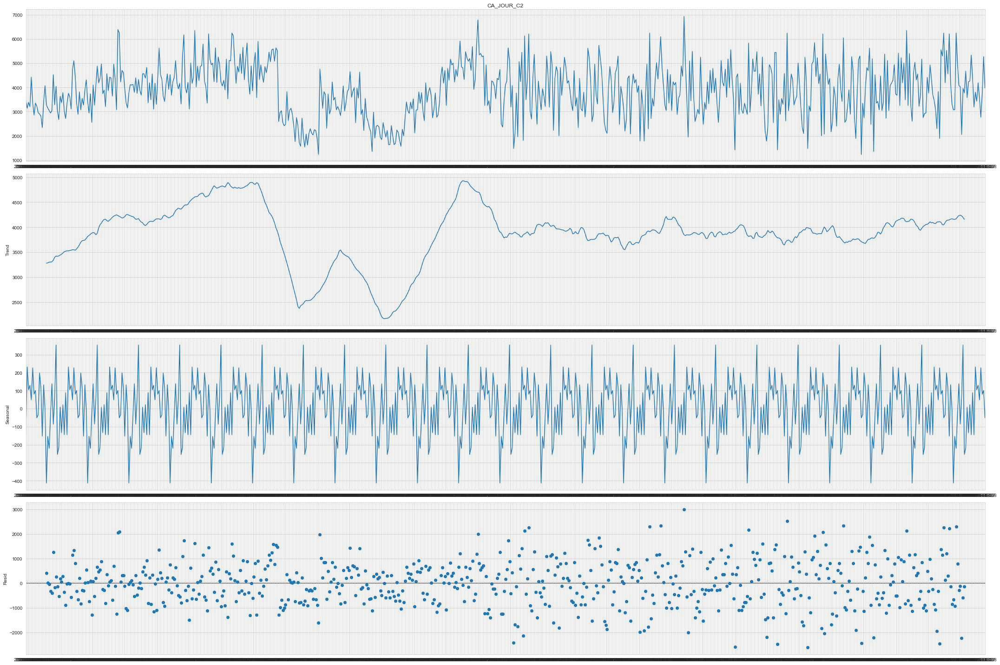

In [57]:
# decompostion ca par jour pour categorie 2

from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
plt.rcParams.update({"figure.figsize":(30,20)})
decomp_ca_par_jour_c2 = seasonal_decompose(ca_par_jour_c2,  model='additive',period=30)
decomp_ca_par_jour_c2.plot()

plt.show()

In [58]:
seasonal_par_jour_c2=decomp_ca_par_jour_c2.seasonal
residu_par_jour_c2=decomp_ca_par_jour_c2.resid
trend_par_jour_c2=decomp_ca_par_jour_c2.trend
decomp_ca_par_jour_c2_csv=ca_par_jour_c2-seasonal_par_jour_c2


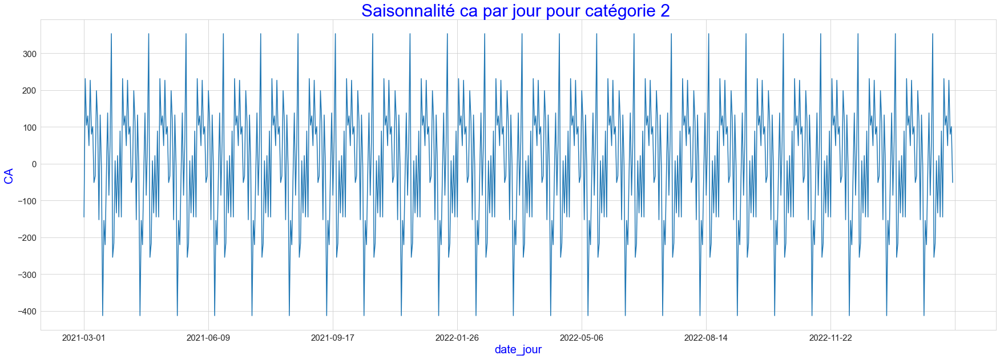

In [59]:
plt.figure(figsize = (30,10))
plt.title("Saisonnalité ca par jour pour catégorie 2 ",fontdict = font1)
plt.xlabel("Date par jour", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)

seasonal_par_jour_c2.plot();


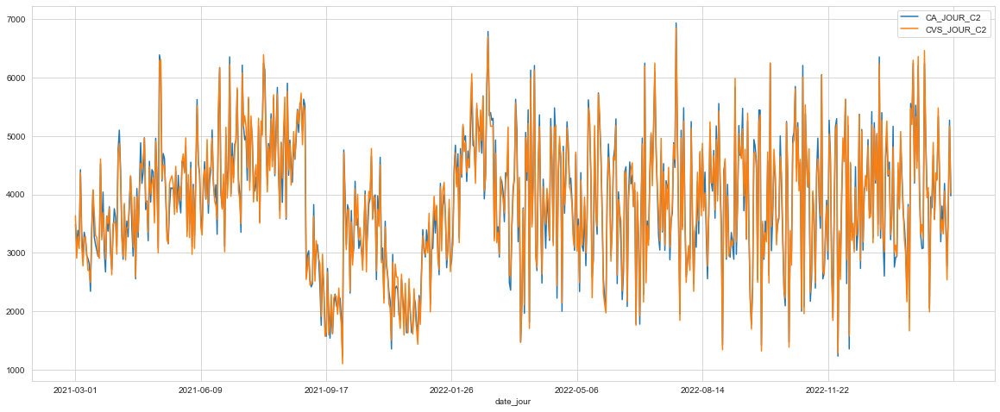

In [60]:

ca_par_jour_c2=ca_par_jour_c2.rename("CA_JOUR_C2")
decomp_ca_par_jour_c2_csv=decomp_ca_par_jour_c2_csv.rename("CVS_JOUR_C2")
ca_par_jour_c2.plot(figsize=(20,8),legend = True)
decomp_ca_par_jour_c2_csv.plot(legend = True);

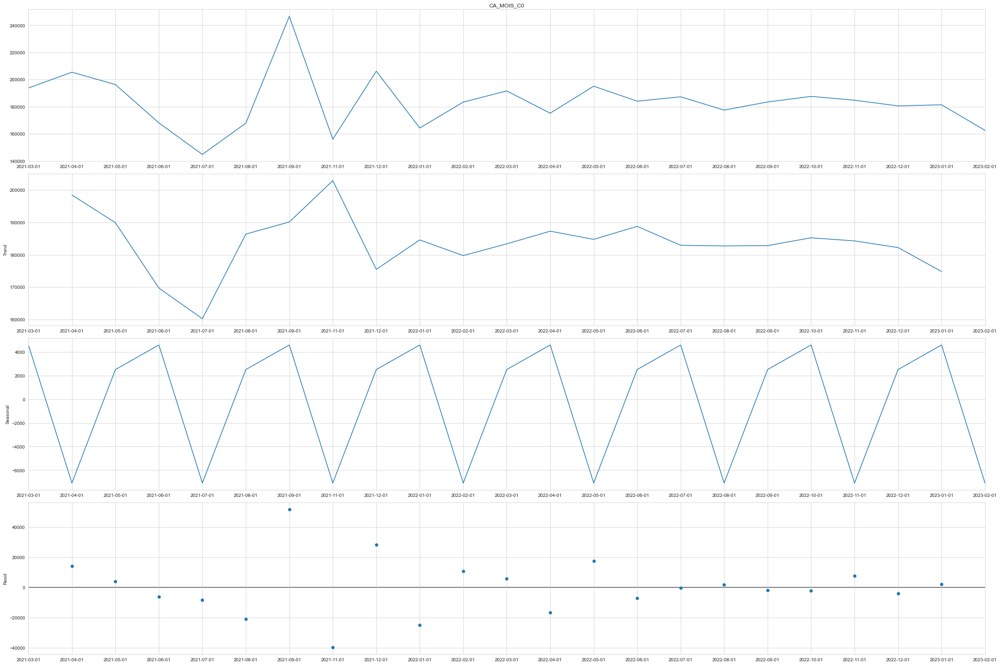

In [61]:
# decomposition ca par mois pour categorie 0 

from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

plt.rcParams.update({"figure.figsize":(30,20)})

decomp_ca_mois_c0 = seasonal_decompose(ca_par_mois_c0,  model='additive',period=3)

decomp_ca_mois_c0.plot()

plt.show()

In [62]:
seasonal_mois_c0=decomp_ca_mois_c0.seasonal
residu_mois_c0=decomp_ca_mois_c0.resid
trend_mois_c0=decomp_ca_mois_c0.trend
decomp_ca_mois_c0_csv=ca_par_mois_c0-seasonal_mois_c0

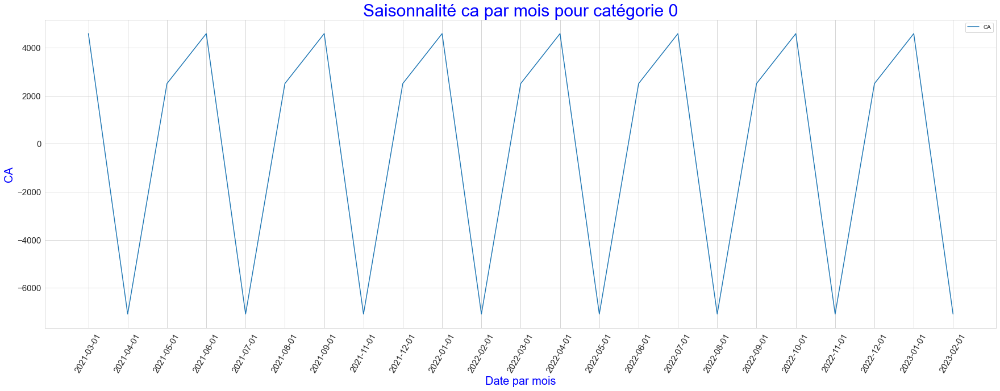

In [63]:
plt.figure(figsize = (30,10))
plt.title("Saisonnalité ca par mois pour catégorie 0",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)

data=seasonal_mois_c0
sns.lineplot(data =data, x = data.index, y=data.values,label="CA");


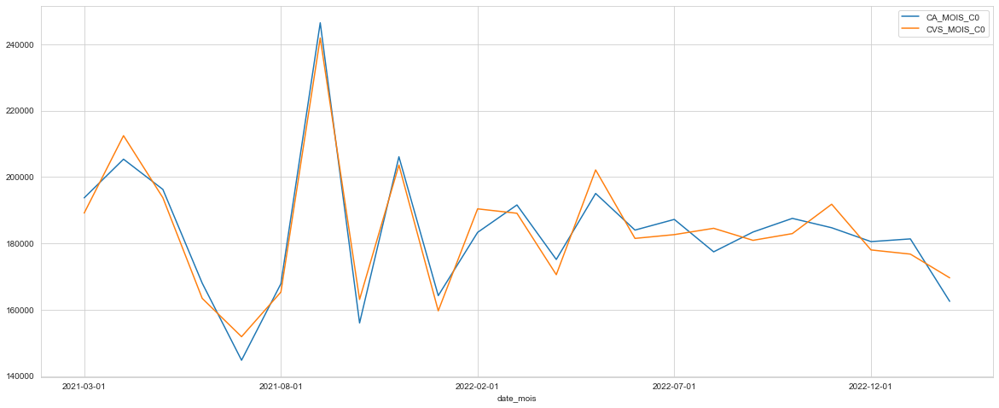

In [64]:
ca_par_mois_c0=ca_par_mois_c0.rename("CA_MOIS_C0")
decomp_ca_mois_c0_csv=decomp_ca_mois_c0_csv.rename("CVS_MOIS_C0")
ca_par_mois_c0.plot(figsize=(20,8),legend = True)
decomp_ca_mois_c0_csv.plot(legend = True);

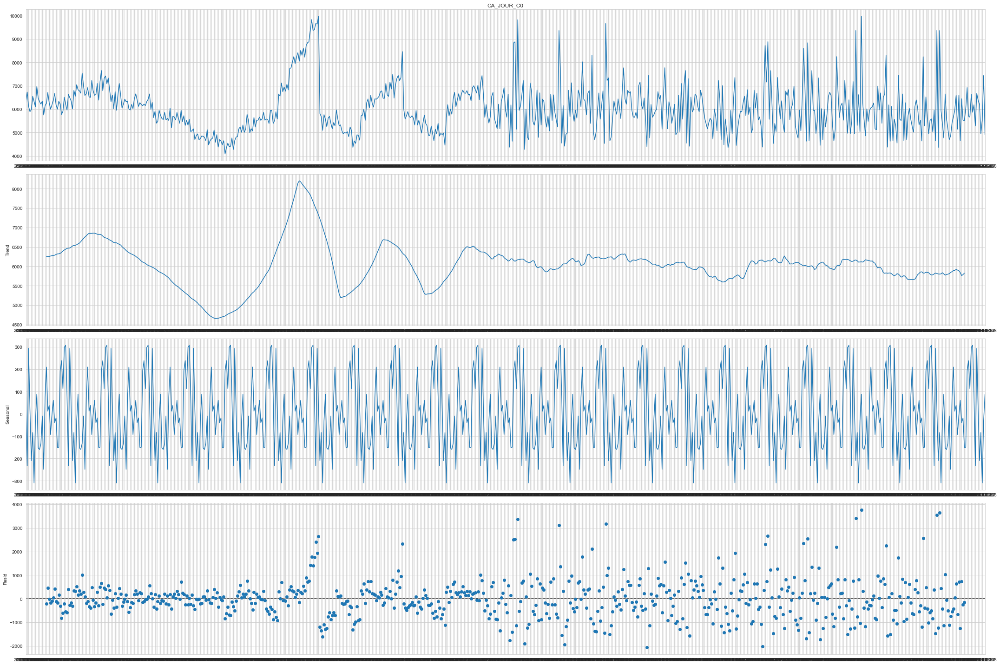

In [65]:
# decompostion ca par jour pour categorie 0

from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
plt.rcParams.update({"figure.figsize":(30,20)})
decomp_ca_par_jour_c0 = seasonal_decompose(ca_par_jour_c0,  model='additive',period=30)
decomp_ca_par_jour_c0.plot()

plt.show()

In [66]:
seasonal_par_jour_c0=decomp_ca_par_jour_c0.seasonal
residu_par_jour_c0=decomp_ca_par_jour_c0.resid
trend_par_jour_c0=decomp_ca_par_jour_c0.trend
decomp_ca_par_jour_c0_csv=ca_par_jour_c0-seasonal_par_jour_c0


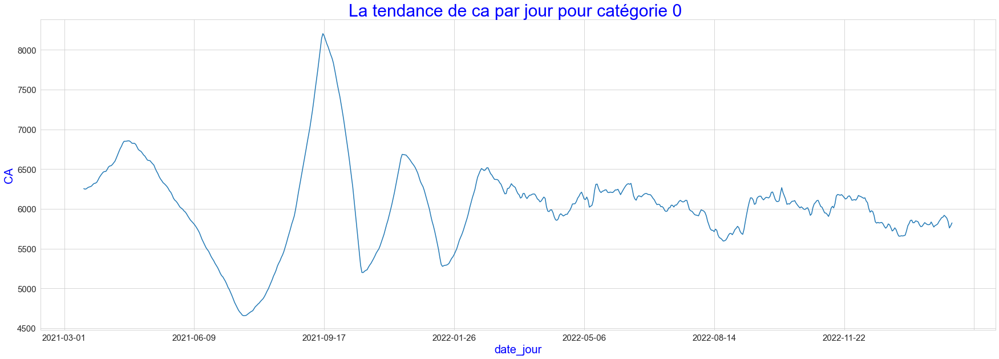

In [67]:
plt.figure(figsize = (30,10))
plt.title("La tendance de ca par jour pour catégorie 0 ",fontdict = font1)
plt.xlabel("Date par jour", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)

trend_par_jour_c0.plot();


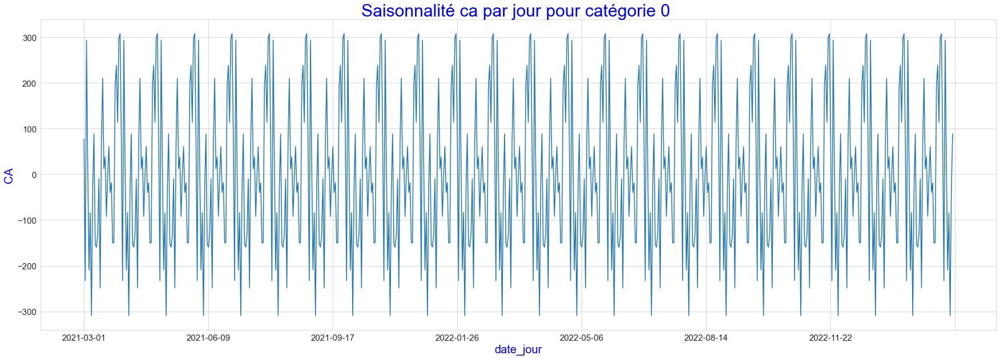

In [68]:
plt.figure(figsize = (30,10))
plt.title("Saisonnalité ca par jour pour catégorie 0 ",fontdict = font1)
plt.xlabel("Date par jour", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)

seasonal_par_jour_c0.plot();


In [69]:
# On constate les oscillations grand pour la saisonalité journalier

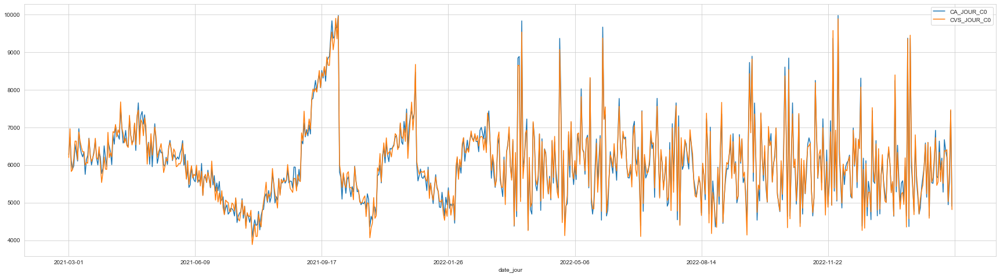

In [70]:
ca_par_jour_c0=ca_par_jour_c0.rename("CA_JOUR_C0")
decomp_ca_par_jour_c0_csv=decomp_ca_par_jour_c0_csv.rename("CVS_JOUR_C0")
ca_par_jour_c0.plot(figsize=(30,8),legend = True)
decomp_ca_par_jour_c0_csv.plot(legend = True);

#  <a name="C6"> 2.2.c- Moyenne Mobile de CA par mois et par jour (Total et par Catégorie)</a>
 <a href="#top">sommaire</a>

In [71]:
ca_mois.head()

date_mois
2021-03-01    482546.18
2021-04-01    476273.52
2021-05-01    493037.31
2021-06-01    484170.67
2021-07-01    482882.32
Name: CA_TOTAL_MOIS, dtype: float64

In [72]:
print(ca_mois.rolling(window=3).mean().head())

date_mois
2021-03-01              NaN
2021-04-01              NaN
2021-05-01    483952.336667
2021-06-01    484493.833333
2021-07-01    486696.766667
Name: CA_TOTAL_MOIS, dtype: float64


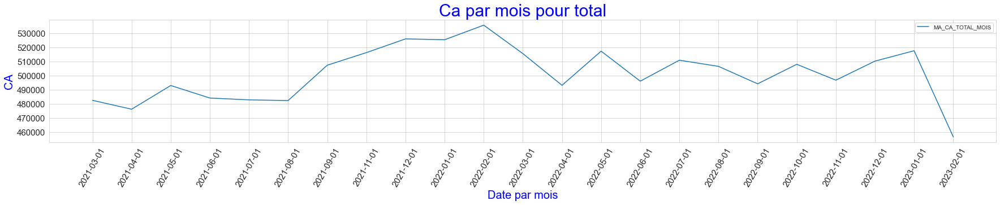

In [73]:

plt.figure(figsize = (30,4))
plt.title("Ca par mois pour total",fontdict = font1)
plt.xlabel("Date par mois", fontdict = font2)
plt.ylabel("CA", fontdict = font2)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)

data=ca_mois
sns.lineplot(data =data, x = data.index, y=data.values,label="MA_CA_TOTAL_MOIS");


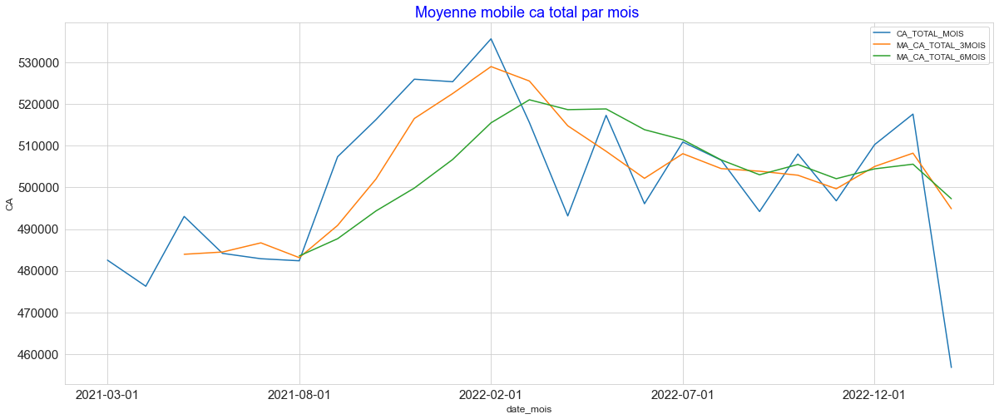

In [74]:
plt.title("Moyenne mobile ca total par mois ",size=18,color="blue")
plt.xlabel("Date par mois", size=12)
plt.ylabel("CA", size=12)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)
ca_mois.plot(figsize=(20,8),legend = True,label="CA_TOTAL_MOIS")
ca_mois.rolling(window=3).mean().plot(figsize=(20,8),legend = True,label="MA_CA_TOTAL_3MOIS")
ca_mois.rolling(window=6).mean().plot(figsize=(20,8),legend = True,label="MA_CA_TOTAL_6MOIS")
plt.savefig("P6_image/ma_ca_mois_trois.png");

In [75]:
# On constate que avec moyen mobile on peux obtenir les graphs plus lisse

In [76]:
ca_jour.head()

date_jour
2021-03-01    16576.95
2021-03-02    15498.18
2021-03-03    15198.69
2021-03-04    15196.07
2021-03-05    17471.37
Name: CA_TOTAL_JOUR, dtype: float64

In [77]:
print(ca_jour.rolling(window=20).mean())

date_jour
2021-03-01           NaN
2021-03-02           NaN
2021-03-03           NaN
2021-03-04           NaN
2021-03-05           NaN
                 ...    
2023-02-24    16150.5365
2023-02-25    16133.0285
2023-02-26    16235.8970
2023-02-27    16283.5865
2023-02-28    16418.9525
Name: CA_TOTAL_JOUR, Length: 699, dtype: float64


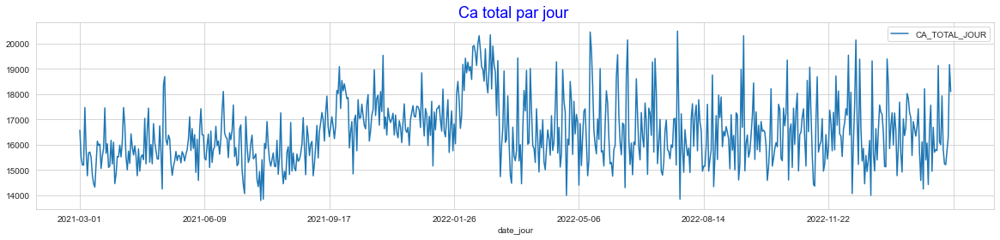

In [78]:
plt.title("Ca total par jour ",size=18,color="blue")
ca_jour.plot(figsize=(20,4),legend = True)
plt.savefig("P6_image/ca_jour.png");

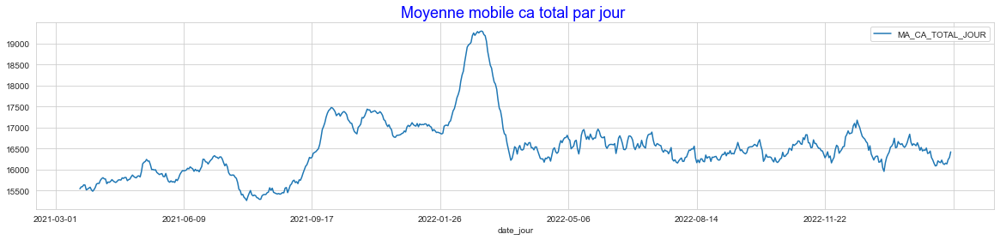

In [79]:
plt.title("Moyenne mobile ca total par jour ",size=18,color="blue")
ca_jour.rolling(window=20).mean().plot(figsize=(20,4),legend = True,label="MA_CA_TOTAL_JOUR")
plt.savefig("P6_image/ma_ca_jour.png");

In [80]:
ca_par_mois_c1.head()

date_mois
2021-03-01    186974.17
2021-04-01    156138.35
2021-05-01    165893.40
2021-06-01    189162.04
2021-07-01    188523.27
Name: CA_MOIS_C1, dtype: float64

In [81]:
print(ca_par_mois_c1.rolling(window=3).mean().head())

date_mois
2021-03-01              NaN
2021-04-01              NaN
2021-05-01    169668.640000
2021-06-01    170397.930000
2021-07-01    181192.903333
Name: CA_MOIS_C1, dtype: float64


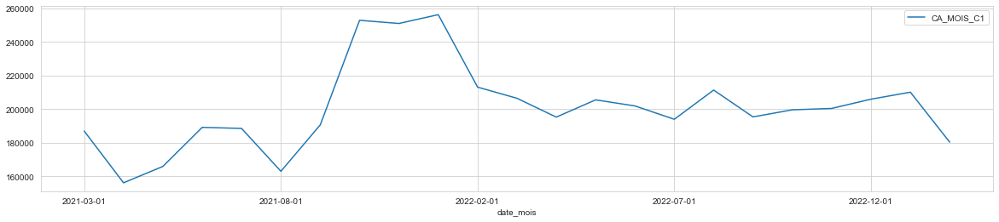

In [82]:
ca_par_mois_c1.plot(figsize=(20,4),legend = True);

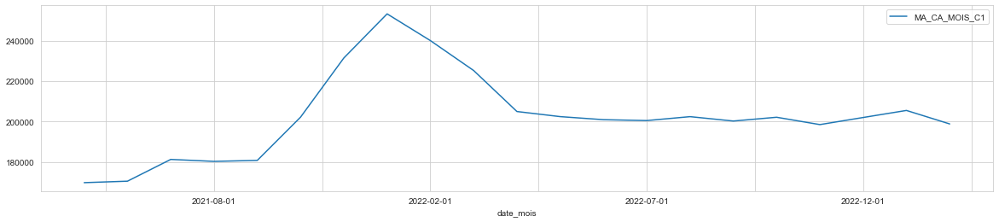

In [83]:
ca_par_mois_c1.rolling(window=3).mean().plot(figsize=(20,4),legend = True,label="MA_CA_MOIS_C1");

In [84]:
ca_par_jour_c1.head()

date_jour
2021-03-01    6811.53
2021-03-02    5627.15
2021-03-03    5691.41
2021-03-04    6098.98
2021-03-05    7071.21
Name: CA_JOUR_C1, dtype: float64

In [85]:
print(ca_par_jour_c1.rolling(window=20).mean().head())

date_jour
2021-03-01   NaN
2021-03-02   NaN
2021-03-03   NaN
2021-03-04   NaN
2021-03-05   NaN
Name: CA_JOUR_C1, dtype: float64


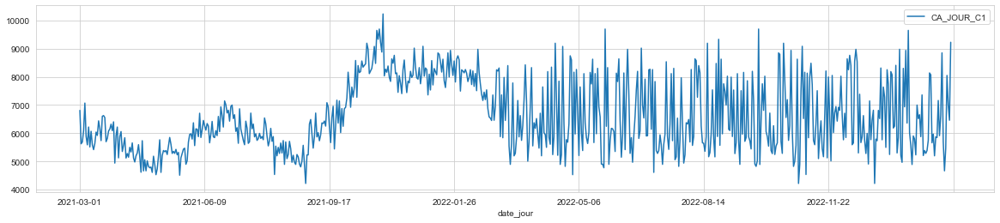

In [86]:
ca_par_jour_c1.plot(figsize=(20,4),legend = True);

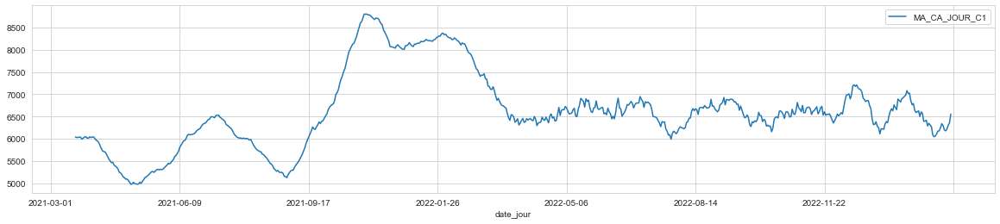

In [87]:
ca_par_jour_c1.rolling(window=20).mean().plot(figsize=(20,4),legend = True,label="MA_CA_JOUR_C1");

In [88]:
ca_par_mois_c2.head()

date_mois
2021-03-01    101837.27
2021-04-01    114748.49
2021-05-01    130863.35
2021-06-01    126983.37
2021-07-01    149561.34
Name: CA_MOIS_C2, dtype: float64

In [89]:
print(ca_par_mois_c2.rolling(window=3).mean().head())

date_mois
2021-03-01              NaN
2021-04-01              NaN
2021-05-01    115816.370000
2021-06-01    124198.403333
2021-07-01    135802.686667
Name: CA_MOIS_C2, dtype: float64


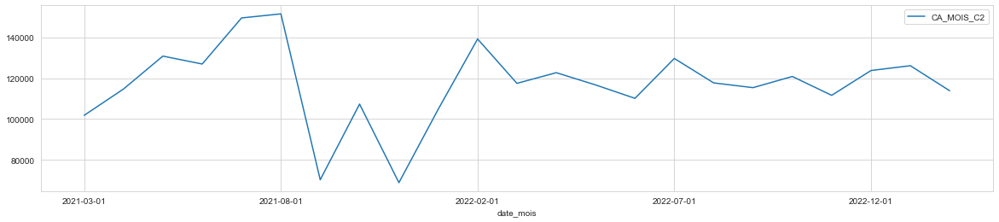

In [90]:
ca_par_mois_c2.plot(figsize=(20,4),legend = True);

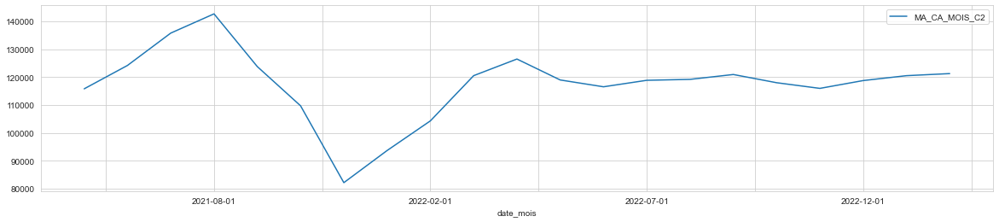

In [91]:
ca_par_mois_c2.rolling(window=3).mean().plot(figsize=(20,4),legend = True,label="MA_CA_MOIS_C2");

In [92]:
ca_par_jour_c2.head()

date_jour
2021-03-01    3491.04
2021-03-02    3141.03
2021-03-03    3386.25
2021-03-04    3205.61
2021-03-05    4424.19
Name: CA_JOUR_C2, dtype: float64

In [93]:
print(ca_par_jour_c2.rolling(window=20).mean().head())

date_jour
2021-03-01   NaN
2021-03-02   NaN
2021-03-03   NaN
2021-03-04   NaN
2021-03-05   NaN
Name: CA_JOUR_C2, dtype: float64


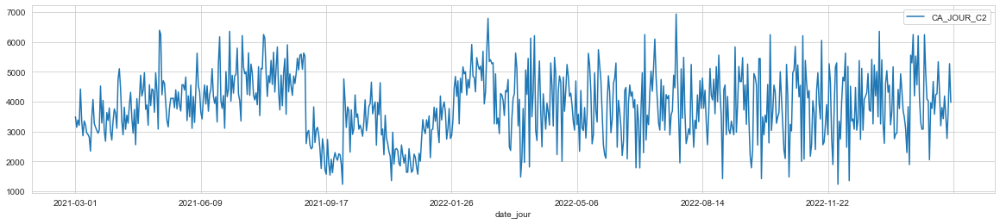

In [94]:
ca_par_jour_c2.plot(figsize=(20,4),legend = True);

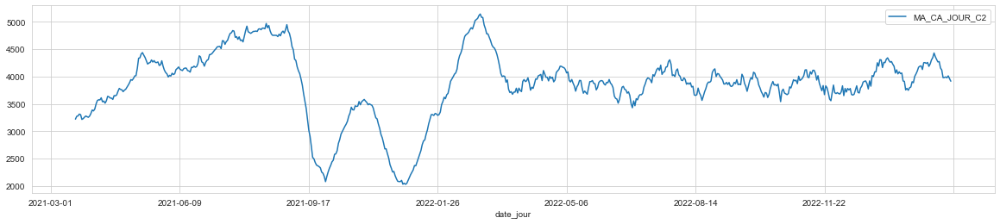

In [95]:
ca_par_jour_c2.rolling(window=20).mean().plot(figsize=(20,4),legend = True,label="MA_CA_JOUR_C2");

In [96]:
ca_par_mois_c0.head()

date_mois
2021-03-01    193734.74
2021-04-01    205386.68
2021-05-01    196280.56
2021-06-01    168025.26
2021-07-01    144797.71
Name: CA_MOIS_C0, dtype: float64

In [97]:
print(ca_par_mois_c0.rolling(window=3).mean().head())

date_mois
2021-03-01              NaN
2021-04-01              NaN
2021-05-01    198467.326667
2021-06-01    189897.500000
2021-07-01    169701.176667
Name: CA_MOIS_C0, dtype: float64


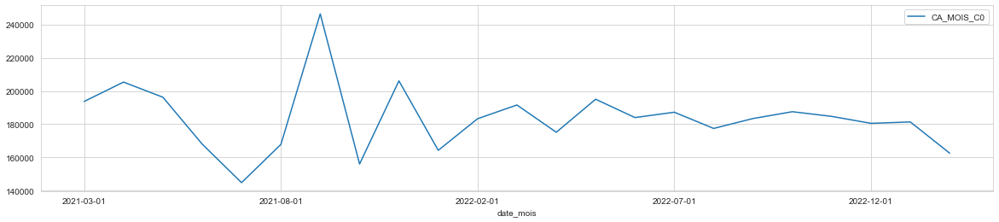

In [98]:
ca_par_mois_c0.plot(figsize=(20,4),legend = True);

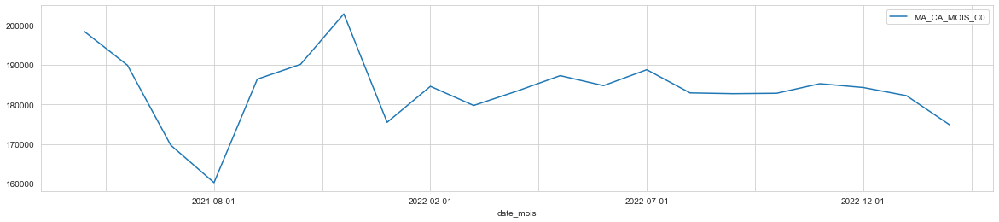

In [99]:
ca_par_mois_c0.rolling(window=3).mean().plot(figsize=(20,4),legend = True,label="MA_CA_MOIS_C0");

In [100]:
ca_par_jour_c0.head()

date_jour
2021-03-01    6274.38
2021-03-02    6730.00
2021-03-03    6121.03
2021-03-04    5891.48
2021-03-05    5975.97
Name: CA_JOUR_C0, dtype: float64

In [101]:
print(ca_par_jour_c0.rolling(window=20).mean().head())

date_jour
2021-03-01   NaN
2021-03-02   NaN
2021-03-03   NaN
2021-03-04   NaN
2021-03-05   NaN
Name: CA_JOUR_C0, dtype: float64


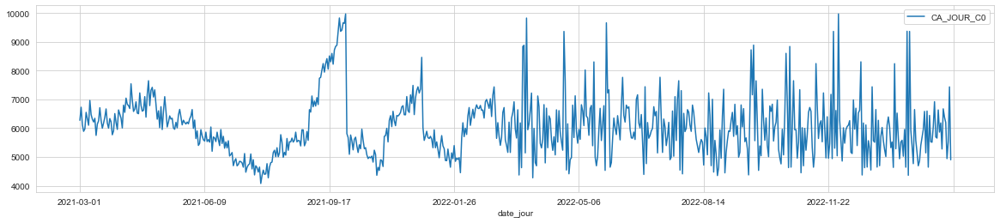

In [102]:
ca_par_jour_c0.plot(figsize=(20,4),legend = True);

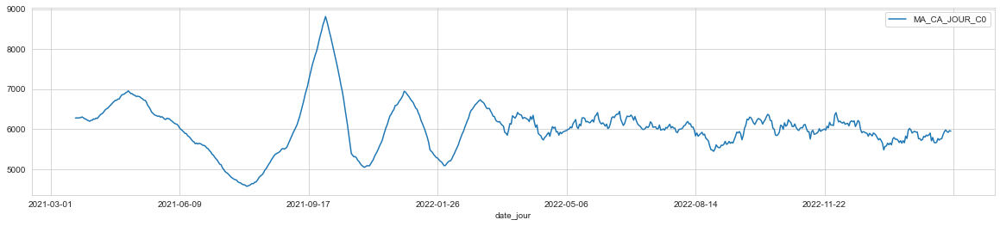

In [103]:
ca_par_jour_c0.rolling(window=20).mean().plot(figsize=(20,4),legend = True,label="MA_CA_JOUR_C0");

# <a name="C7"> 2.3 Un zoom sur les références, pour voir un peu les tops et les flops, la répartition par catégorie
</a>

 <a href="#top">sommaire</a>

## Les 15 produits qui génèrent le plus de ca

In [104]:
ca_par_produit=merge_sans_octobre.groupby("id_prod")["price"].sum().reset_index()
ca_par_produit.rename(columns={"price":"ca"},inplace=True)
ca_par_produit.head()

,id_prod,ca
0,0_0,4477.50
1,0_1,5154.31
2,0_10,323.10
3,0_100,61.80
4,0_1000,2790.72


In [105]:
ca_par_produit=pd.merge(ca_par_produit,products_new,on="id_prod",how="inner")
ca_par_produit.head()

,id_prod,ca,price,categ
0,0_0,4477.50,3.75,0
1,0_1,5154.31,10.99,0
2,0_10,323.10,17.95,0
3,0_100,61.80,20.60,0
4,0_1000,2790.72,6.84,0


## Les tops en ca

In [106]:
prod_tops=ca_par_produit.sort_values(by="ca",ascending=False).head(15)
prod_tops

,id_prod,ca,price,categ
3095,2_159,92265.68,145.99,2
3069,2_135,67403.23,68.99,2
3044,2_112,62840.10,67.57,2
3033,2_102,58962.58,59.14,2
3151,2_209,55362.09,69.99,2
2618,1_395,53950.39,28.99,1
2590,1_369,53665.63,23.99,1
3042,2_110,51916.50,62.25,2
2640,1_414,51615.78,23.83,1
3200,2_39,51147.18,57.99,2


In [107]:
prod_tops["categ"].value_counts() 

2    9
1    6
Name: categ, dtype: int64

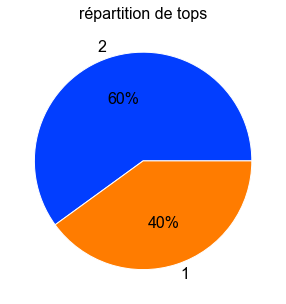

In [108]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams.update({"figure.figsize":(5,5)})
data_tops =prod_tops["categ"].value_counts() 
labels = data_tops.index
colors = sns.color_palette('bright')
plt.pie(data_tops, labels=labels,colors = colors, textprops = {'color': 'black','fontsize':16}, autopct = '%0.0f%%')
plt.title("répartition de tops",color= 'black',fontsize=16)
plt.savefig("P6_image/prod_top_ca_graph.png")
plt.show()


## Les flops en ca

In [109]:
prod_flops=ca_par_produit.sort_values(by="ca",ascending=True).head(15)
prod_flops

,id_prod,ca,price,categ
594,0_1539,0.99,0.99,0
2178,0_898,1.27,1.27,0
313,0_1284,1.38,1.38,0
1896,0_643,1.98,0.99,0
718,0_1653,1.98,0.99,0
2078,0_807,1.99,1.99,0
1783,0_541,1.99,1.99,0
664,0_1601,1.99,1.99,0
801,0_1728,2.27,2.27,0
1543,0_324,2.36,1.18,0


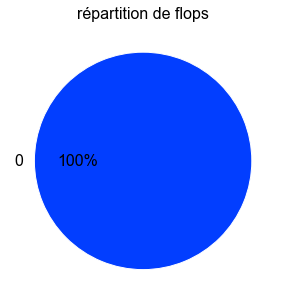

In [110]:
data_flops =prod_flops["categ"].value_counts() 
labels = data_flops.index
colors = sns.color_palette('bright')
plt.pie(data_flops, labels=labels,colors = colors, textprops = {'color': 'black','fontsize':16}, autopct = '%0.0f%%')
plt.title("répartition de flops",color= 'black',fontsize=16)
plt.savefig("P6_image/prod_flop_ca_graph.png")
plt.show()

In [111]:
ca_par_categ=merge_sans_octobre.groupby("categ")["price"].sum()

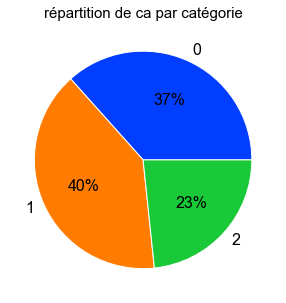

In [112]:
import matplotlib.pyplot as plt
import seaborn as sns

#define data
data = ca_par_categ.values
labels =ca_par_categ.index

#define Seaborn color palette to use
colors = sns.color_palette('bright')[0:10]
font1 = {'color':'black','size':15}
#create pie chart
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%',textprops = {'color': 'black','fontsize':16})
plt.title("répartition de ca par catégorie",fontdict=font1)
plt.show()

## Les produits ont plus vendus en quantité

In [113]:
prod_par_quant=merge_sans_octobre["id_prod"].value_counts().reset_index()
prod_par_quant.rename(columns={"index":"id_prod","id_prod":"quantite"},inplace=True)
prod_par_quant.head()

,id_prod,quantite
0,1_369,2237
1,1_417,2173
2,1_414,2166
3,1_498,2117
4,1_425,2084


In [114]:
data_quant=pd.merge(prod_par_quant,products_new,on="id_prod",how="inner")
data_quant.head()

,id_prod,quantite,price,categ
0,1_369,2237,23.99,1
1,1_417,2173,20.99,1
2,1_414,2166,23.83,1
3,1_498,2117,23.37,1
4,1_425,2084,16.99,1


In [115]:
prod_par_quant=data_quant

# Les tops en quantité

In [116]:
prod_par_quant_tops=prod_par_quant.sort_values(by="quantite",ascending=False).head(15)
prod_par_quant_tops

,id_prod,quantite,price,categ
0,1_369,2237,23.99,1
1,1_417,2173,20.99,1
2,1_414,2166,23.83,1
3,1_498,2117,23.37,1
4,1_425,2084,16.99,1
5,1_403,1950,17.99,1
6,1_412,1938,16.65,1
7,1_406,1931,24.81,1
8,1_413,1931,17.99,1
9,1_407,1923,15.99,1


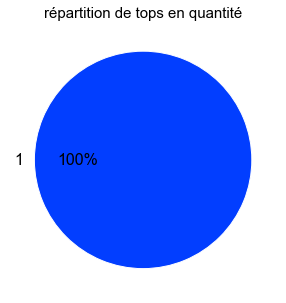

In [117]:
data_quant_tops =prod_par_quant_tops["categ"].value_counts() 
labels = data_quant_tops.index
colors = sns.color_palette('bright')
plt.pie(data_quant_tops, labels=labels,colors = colors, textprops = {'color': 'black','fontsize':16}, autopct = '%0.0f%%')
plt.title("répartition de tops en quantité",fontdict=font1)
plt.savefig("P6_image/prod_top_quant_graph.png")
plt.show()

# Les flops en quantité

In [118]:
prod_par_quant_flops=prod_par_quant.sort_values(by="quantite",ascending=True).head(15)
prod_par_quant_flops

,id_prod,quantite,price,categ
3263,0_886,1,21.82,0
3244,0_1601,1,1.99,0
3245,0_898,1,1.27,0
3246,0_833,1,2.99,0
3247,0_1498,1,2.48,0
3248,0_549,1,2.99,0
3249,0_1595,1,2.99,0
3250,0_1284,1,1.38,0
3251,0_807,1,1.99,0
3252,0_1539,1,0.99,0


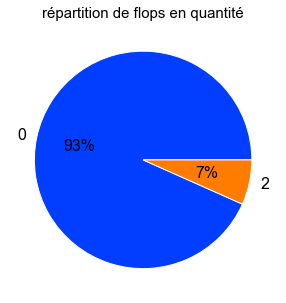

In [119]:
data_quant_flops =prod_par_quant_flops["categ"].value_counts() 
labels = data_quant_flops.index
colors = sns.color_palette('bright')
plt.pie(data_quant_flops, labels=labels,colors = colors, textprops = {'color': 'black','fontsize':16}, autopct = '%0.0f%%')
plt.title("répartition de flops en quantité",fontdict=font1)
plt.savefig("P6_image/flop_quant_graph.png")
plt.show()

In [120]:
vents_par_categ=merge_sans_octobre["categ"].value_counts()
vents_par_categ

0    396911
1    225503
2     35312
Name: categ, dtype: int64

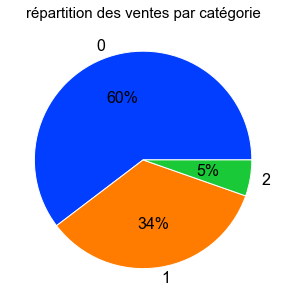

In [121]:
import matplotlib.pyplot as plt
import seaborn as sns

#define data
data = vents_par_categ.values
labels =vents_par_categ.index

#define Seaborn color palette to use
colors = sns.color_palette('bright')[0:10]
#create pie chart
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%',textprops = {'color': 'black','fontsize':16})
plt.title("répartition des ventes par catégorie",fontdict=font1)
plt.savefig("P6_image/dispértion_quant_graph.png")
plt.show()

In [122]:
prods_vente=merge_sans_octobre["id_prod"].value_counts()
prods_vente

1_369     2237
1_417     2173
1_414     2166
1_498     2117
1_425     2084
          ... 
0_1633       1
2_81         1
0_1533       1
0_1728       1
0_886        1
Name: id_prod, Length: 3264, dtype: int64

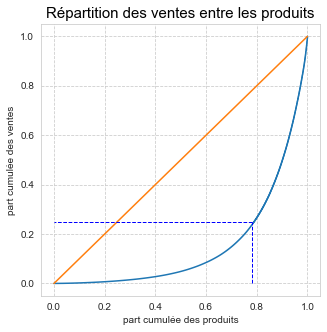

In [123]:
dep1 = prods_vente.values
n = len(dep1)
lorenz = np.cumsum(np.sort(dep1)) / dep1.sum()
lorenz = np.append([0],lorenz) # La courbe de Lorenz commence à 0
plt.ylabel('part cumulée des ventes')
plt.xlabel('part cumulée des produits')
xaxis = np.linspace(0-1/n,1+1/n,n+1) #Il y a un segment de taille n pour chaque individu, plus 1 segment supplémentaire d'ordonnée 0. Le premier segment commence à 0-1/n, et le dernier termine à 1+1/n.
plt.plot(xaxis,lorenz,drawstyle='steps-post')
plt.plot([0,1], [0,1])#tracer la bisséctrice
plt.vlines(x=.78, ymin=0, ymax=.25, color='blue', linestyle='--', linewidth=1,label='Medial')
plt.hlines(xmin=.78, xmax=0, y=.25, color='blue', linestyle='--', linewidth=1)
font1 = {'color':'black','size':15}
plt.title("Répartition des ventes entre les produits",fontdict=font1)
plt.grid(True,which="both", linestyle='--')
plt.savefig("P6_image/répartition_quant_graph.png")
plt.show()

In [124]:
# environ 80% des produits génèrent uniquement 25% de ventes 
# environ 25% des produits génèrent environ 80% de ventes

# <a name="C8"> 2.4 Quelques informations sur les profils des clients et la répartition du CA entre eux</a>
<a href="#top">sommaire</a>

In [125]:
customers_new["sex"].value_counts()


f    4490
m    4131
Name: sex, dtype: int64

In [126]:
comptage_sex_clients = customers_new["sex"].value_counts()

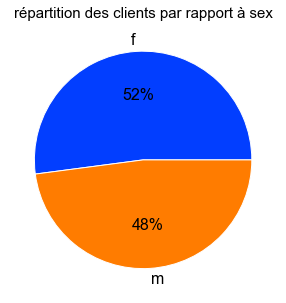

In [127]:
#define data
data = comptage_sex_clients.values
labels =comptage_sex_clients.index

#define Seaborn color palette to use
colors = sns.color_palette('bright')[0:10]
#create pie chart
font1 = {'color':'black','size':15}
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%',textprops = {'color': 'black','fontsize':16})
plt.title("répartition des clients par rapport à sex",fontdict=font1)
plt.savefig("P6_image/dispértion_clients_graph.png")
plt.show()

In [128]:
customers_new["age"].max()

94

In [129]:
customers_new["age"].min()

19

In [130]:
round(customers_new["age"].mean())

45

In [131]:
customers_new["age"].unique()

array([56, 48, 39, 61, 80, 30, 45, 52, 41, 78, 20, 64, 46, 69, 36, 23, 31,
       60, 65, 29, 87, 37, 81, 53, 66, 55, 21, 19, 44, 49, 59, 72, 86, 42,
       58, 63, 27, 40, 33, 68, 35, 32, 51, 43, 34, 47, 38, 70, 25, 67, 75,
       50, 54, 85, 28, 71, 74, 24, 22, 84, 73, 57, 88, 82, 62, 26, 79, 94,
       76, 77, 91, 92, 90, 93, 83, 89])

In [132]:
customers_new.groupby(by="age")["sex"].value_counts()

age  sex
19   f      232
     m      208
20   m       81
     f       65
21   m       80
           ... 
92   m        2
93   f        3
     m        1
94   m        2
     f        1
Name: sex, Length: 152, dtype: int64

In [133]:
X_client = "sex"
Y_client = "age"
cross_age_sex=pd.crosstab(customers_new[X_client],customers_new[Y_client])
cross_age_sex

age,19,20,21,22,23,24,25,26,27,28,...,85,86,87,88,89,90,91,92,93,94
sex,,,,,,,,,,,,,,,,,,,,,
f,232,65,66,71,78,79,71,77,94,100,...,12,12,10,6,8,5,5,2,3,1
m,208,81,80,56,58,81,67,75,85,75,...,6,5,2,2,5,3,1,2,1,2


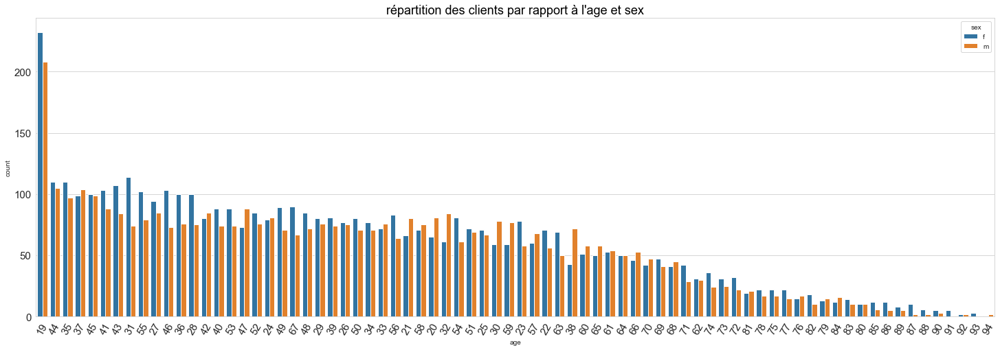

In [134]:
plt.figure(figsize=(25, 8))
age_order = customers_new['age'].value_counts().index
font1 = {'color':'black','size':18}
plt.title("répartition des clients par rapport à l'age et sex",fontdict=font1)
plt.xticks(rotation=60,size=15)
plt.yticks(size=15)
sns.countplot(x="age", order=age_order,hue="sex",data=customers_new)
plt.savefig("P6_image/dispértion_clients_age_graph.png");


In [135]:
# Il y a beaucoup de clients de 19 ans 
# Soit cette boutique vend des produits pour les jeunes ou étudiants
# Soit cette boutique est accesible à partir de 19 ans et certains clients mettre leur age comme 19 

In [136]:
X_client1 = "sex"
Y_client1 = "cat_age"
cross_cat_age_sex=pd.crosstab(customers_new[X_client1],customers_new[Y_client1])
cross_cat_age_sex

cat_age,adult 30-45,jeune <25,jeune-adult 25-30,moyen-age 45-60,senior >60
sex,,,,,
f,911,662,844,1182,891
m,861,631,791,1076,772


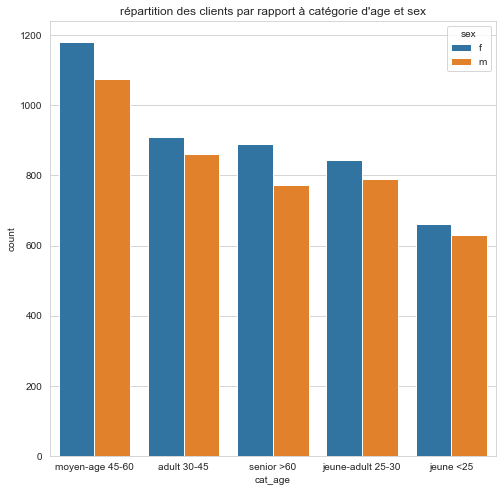

In [137]:
plt.figure(figsize=(8, 8))
age_order = customers_new['cat_age'].value_counts().index 
plt.title("répartition des clients par rapport à catégorie d'age et sex")
sns.countplot(x="cat_age",hue="sex" , order=age_order,data=customers_new);

In [138]:
customers_new.groupby(by="sex")["age"].min()


sex
f    19
m    19
Name: age, dtype: int64

In [139]:
customers_new.groupby(by="sex")["age"].max()


sex
f    94
m    94
Name: age, dtype: int64

In [140]:
customers_new.groupby(by="sex")["age"].mean()

sex
f    45.010245
m    44.413701
Name: age, dtype: float64

# La répartition du chiffre d'affaires entre eux, via une courbe de Lorenz.

In [141]:
merge_sans_octobre.groupby("sex")["price"].sum()

sex
f    5705708.42
m    5829731.74
Name: price, dtype: float64

In [142]:
merge_sans_octobre.head()

,client_id,sex,birth,age,cat_age,id_prod,price,categ,session_id,date_jour,date_mois
0,c_4410,f,1967,56,moyen-age 45-60,1_385,25.99,1,s_9707,2021-03-22,2021-03-01
1,c_4410,f,1967,56,moyen-age 45-60,1_385,25.99,1,s_345108,2023-02-22,2023-02-01
2,c_4410,f,1967,56,moyen-age 45-60,0_1110,4.71,0,s_114715,2021-11-04,2021-11-01
3,c_4410,f,1967,56,moyen-age 45-60,0_1111,19.99,0,s_345108,2023-02-22,2023-02-01
4,c_4410,f,1967,56,moyen-age 45-60,0_1111,19.99,0,s_9707,2021-03-22,2021-03-01


In [143]:
client_tops=merge_sans_octobre.groupby("client_id")["price"].sum().sort_values(ascending=False).reset_index().head(10)
client_tops

,client_id,price
0,c_1609,312755.08
1,c_4958,282654.61
2,c_6714,149854.13
3,c_3454,111801.90
4,c_2899,5214.05
5,c_1570,5136.14
6,c_3263,5129.89
7,c_7319,5120.55
8,c_8026,4981.14
9,c_5263,4964.87


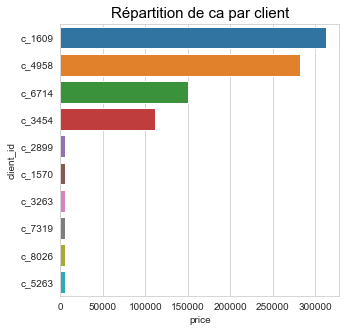

In [144]:
font1 = {'color':'black','size':15}
sns.barplot(y=client_tops["client_id"],
            x=client_tops["price"]).set_title("Répartition de ca par client",fontdict=font1)
plt.savefig("P6_image/Répartition_clients_ca_graph.png");


In [145]:
# Il y a 4 clients qui achètent beaucoup. Ils sont des professionnels. 
#On va séparer 4 clients professionnels

In [146]:
mask_b_to_b=merge_sans_octobre["client_id"].isin(["c_1609","c_4958","c_6714","c_3454"])

In [147]:
merge_sans_octobre[mask_b_to_b]

,client_id,sex,birth,age,cat_age,id_prod,price,categ,session_id,date_jour,date_mois
98644,c_4958,m,1999,24,jeune <25,1_587,4.99,1,s_283920,2022-10-17,2022-10-01
98645,c_4958,m,1999,24,jeune <25,1_587,4.99,1,s_254678,2022-08-17,2022-08-01
98646,c_4958,m,1999,24,jeune <25,1_587,4.99,1,s_121110,2021-11-17,2021-11-01
98647,c_4958,m,1999,24,jeune <25,1_587,4.99,1,s_195468,2022-04-17,2022-04-01
98648,c_4958,m,1999,24,jeune <25,2_228,225.17,2,s_219702,2022-06-06,2022-06-01
...,...,...,...,...,...,...,...,...,...,...,...
620390,c_3454,m,1969,54,moyen-age 45-60,1_387,9.99,1,s_193823,2022-04-14,2022-04-01
620391,c_3454,m,1969,54,moyen-age 45-60,1_387,9.99,1,s_119415,2021-11-14,2021-11-01
620392,c_3454,m,1969,54,moyen-age 45-60,0_2245,11.73,0,s_18560,2021-04-10,2021-04-01
620393,c_3454,m,1969,54,moyen-age 45-60,0_2245,11.73,0,s_191922,2022-04-10,2022-04-01


In [148]:
ca_total=round(merge_sans_octobre["price"].sum(),2)
ca_total

11535440.16

In [149]:
trans_clients_prof=merge_sans_octobre[mask_b_to_b]
trans_clients_prof.head()

,client_id,sex,birth,age,cat_age,id_prod,price,categ,session_id,date_jour,date_mois
98644,c_4958,m,1999,24,jeune <25,1_587,4.99,1,s_283920,2022-10-17,2022-10-01
98645,c_4958,m,1999,24,jeune <25,1_587,4.99,1,s_254678,2022-08-17,2022-08-01
98646,c_4958,m,1999,24,jeune <25,1_587,4.99,1,s_121110,2021-11-17,2021-11-01
98647,c_4958,m,1999,24,jeune <25,1_587,4.99,1,s_195468,2022-04-17,2022-04-01
98648,c_4958,m,1999,24,jeune <25,2_228,225.17,2,s_219702,2022-06-06,2022-06-01


In [150]:
ca_prof=trans_clients_prof["price"].sum()
ca_prof

857065.72

In [151]:
pourcentage_ca_prof=round(ca_prof/ca_total*100,2)
pourcentage_ca_prof

7.43

In [152]:
trans_clients_particul=merge_sans_octobre[~mask_b_to_b]

In [153]:
ca_particul=round(trans_clients_particul["price"].sum(),2)
ca_particul

10678374.44

In [154]:
pourcentage_ca_particul=round(ca_particul/ca_total*100,2)
pourcentage_ca_particul

92.57

In [155]:
ca_par_cat_age=trans_clients_particul.groupby("cat_age")["price"].sum().reset_index()
ca_par_cat_age

,cat_age,price
0,adult 30-45,2699677.43
1,jeune <25,1669296.02
2,jeune-adult 25-30,2229634.77
3,moyen-age 45-60,2596625.29
4,senior >60,1483140.93


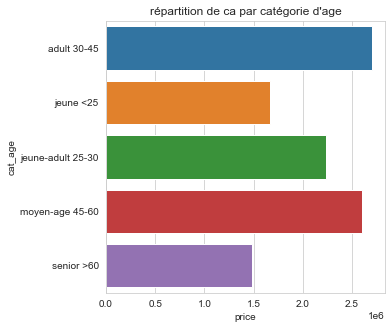

In [156]:
sns.barplot(y=ca_par_cat_age["cat_age"],
            x=ca_par_cat_age["price"]).set_title("répartition de ca par catégorie d'age");


In [157]:
group_client_particul=trans_clients_particul.groupby("client_id")["price"].sum().reset_index()
group_client_particul.head()

,client_id,price
0,c_1,550.19
1,c_10,1353.60
2,c_100,254.85
3,c_1000,2209.92
4,c_1001,1720.08


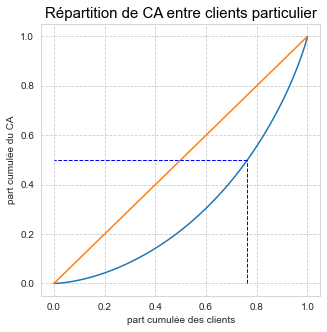

In [158]:
dep = group_client_particul["price"].values
n = len(dep)
lorenz = np.cumsum(np.sort(dep)) / dep.sum()
lorenz = np.append([0],lorenz) # La courbe de Lorenz commence à 0
plt.ylabel('part cumulée du CA')
plt.xlabel('part cumulée des clients')
xaxis = np.linspace(0-1/n,1+1/n,n+1) #Il y a un segment de taille n pour chaque individu, plus 1 segment supplémentaire d'ordonnée 0. Le premier segment commence à 0-1/n, et le dernier termine à 1+1/n.
plt.plot(xaxis,lorenz,drawstyle='steps-post')
plt.plot([0,1], [0,1])#tracer la bisséctrice
plt.vlines(x=.76, ymin=0, ymax=.5, color='blue', linestyle='--', linewidth=1, label='Medial')
plt.hlines(xmin=.76, xmax=0, y=.5, color='blue', linestyle='--', linewidth=1)
font1 = {'color':'black','size':15}
plt.title("Répartition de CA entre clients particulier",fontdict=font1)
plt.grid(True,which="both", linestyle='--')
plt.savefig("P6_image/répartition_ca_clients_graph.png")
plt.show()

In [159]:
AUC = (lorenz.sum() -lorenz[-1]/2 -lorenz[0]/2)/n # Surface sous la courbe de Lorenz. Le premier segment (lorenz[0]) est à moitié en dessous de 0, on le coupe donc en 2, on fait de même pour le dernier segment lorenz[-1] qui est à moitié au dessus de 1.
S = 0.5 - AUC # surface entre la première bissectrice et le courbe de Lorenz
gini = 2*S
round(gini,2)

0.4

In [160]:
# 50% de CA viens d'environ 76% des clients
# environ 24% de clients génèrent 50% de ca

# Deuxième Mission (Les demandes de Julie)

 #  <a name="C16"> Analyse de distribution gaussien normal</a>
 <a href="#top">sommaire</a>

## Analyse de distribution gaussien normal pour choisir les tests paramétrique ou non paramétrique

In [161]:
trans_clients_particul.head()

,client_id,sex,birth,age,cat_age,id_prod,price,categ,session_id,date_jour,date_mois
0,c_4410,f,1967,56,moyen-age 45-60,1_385,25.99,1,s_9707,2021-03-22,2021-03-01
1,c_4410,f,1967,56,moyen-age 45-60,1_385,25.99,1,s_345108,2023-02-22,2023-02-01
2,c_4410,f,1967,56,moyen-age 45-60,0_1110,4.71,0,s_114715,2021-11-04,2021-11-01
3,c_4410,f,1967,56,moyen-age 45-60,0_1111,19.99,0,s_345108,2023-02-22,2023-02-01
4,c_4410,f,1967,56,moyen-age 45-60,0_1111,19.99,0,s_9707,2021-03-22,2021-03-01


In [162]:
df1=trans_clients_particul[["birth","age","price"]]

In [163]:
columns=df1.columns

In [164]:
columns

Index(['birth', 'age', 'price'], dtype='object')

## Histogram Plot

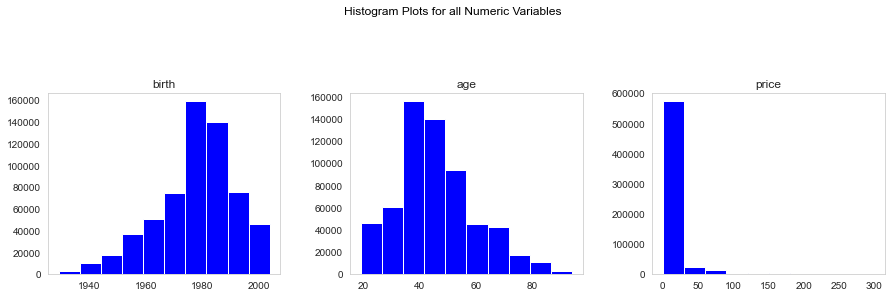

In [165]:
font1 = {'color':'black','size':18}
df1.hist(layout=(3,3),color='blue', figsize=(15,12), grid=False)
plt.suptitle("Histogram Plots for all Numeric Variables",fontdict=font1);

QQ plot of: birth


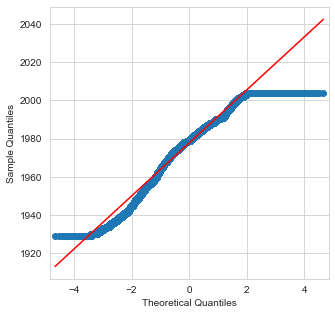

QQ plot of: age


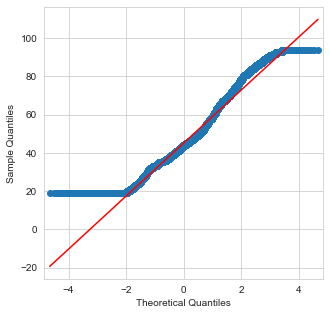

QQ plot of: price


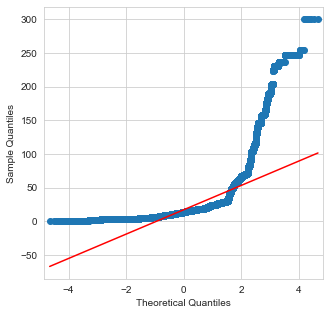

In [166]:
import statsmodels.api as sm
import pylab

for i, val in enumerate(df1):
    print('QQ plot of:', val)
    sm.qqplot(df1[val], line='s')
    plt.show()

### Jarque–Bera test

In [167]:
# H0= L'échantion a une distribution normal
# H1= L'échantion n'a pas une distribution normal
from scipy import stats
alpha = 0.05
for i in columns:
    print ([i])
    a,b= stats.jarque_bera(df1[[i]])
    print ("Statistics", a, "p-value", b)
    if b < alpha:  
        print("On peut rejeter l'hypothèse null")
    else:
        print("On ne peut pas rejeter l'hypothèse null")
    

['birth']
Statistics 37482.05467945997 p-value 0.0
On peut rejeter l'hypothèse null
['age']
Statistics 37482.05467946041 p-value 0.0
On peut rejeter l'hypothèse null
['price']
Statistics 52357710.031388864 p-value 0.0
On peut rejeter l'hypothèse null


### Shapiro-Wilk Test

In [168]:
# H0= L'échantion a une distribution normal
# H1= L'échantion n'a pas une distribution normal
for i in columns:
    print ([i])
    a,b= stats.shapiro(df1[[i]])
    print ("Statistics", a, "p-value", b)
    if b < alpha:  
        print("On peut rejeter l'hypothèse null")
    else:
        print("On ne peut pas rejeter l'hypothèse null")

['birth']
Statistics 0.9413831233978271 p-value 0.0
On peut rejeter l'hypothèse null
['age']
Statistics 0.9721125364303589 p-value 0.0
On peut rejeter l'hypothèse null
['price']
Statistics 0.5485801696777344 p-value 0.0
On peut rejeter l'hypothèse null


### Comme les échantillons n'ont pas la distrubution normal on va choisir les tests non paramétrique

# <a name="C9">  3.1 Le lien entre le genre d’un client et les catégories des livres achetés</a>
<a href="#top">sommaire</a>

# Analysez deux variables qualitatives avec le Chi-2

In [169]:
cont=pd.crosstab(trans_clients_particul["sex"], trans_clients_particul["categ"])
cont

categ,0,1,2
sex,,,
f,192025,110550,16429
m,178044,100227,15351


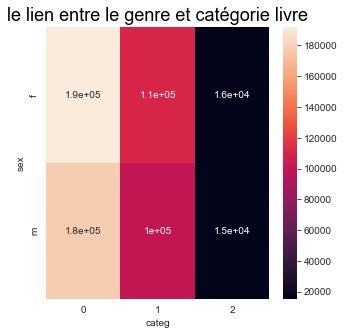

In [170]:
sns.heatmap(cont,annot=True)
plt.title("le lien entre le genre et catégorie livre",fontdict=font1);


Foncé quand la mesure est grande, clair quand elle est proche de 0. Ainsi, on détecte facilement les cases qui sont source de non-indépendance : cette représentation s'appelle une carte de chaleur, ou heatmap, en anglais.

### TEST STAT INDEPENDANCE QUALI_QUALI

#   Le test chi2

In [171]:
# H0= ils sont indépendentes sex et categ
# H1= Corrélation entre deux variables

from scipy.stats import chi2_contingency
obs = cont
chi2_contingency(obs)

(18.75788251563821,
 8.448460261159054e-05,
 2,
 array([[192700.75262232, 109754.90120889,  16548.34616879],
        [177368.24737768, 101022.09879111,  15231.65383121]]))

In [172]:
# p value est inférieur à 0.05 alors on rejette H0 
# Il y a une corrélation entre le genre d’un client et les catégories des livres achetés

### Rejet de H0 au niveau de test α⇔p-valeur<α
Si la p-valeur est faible (selon un critère fixé par le domaine concerné), cela signifie que l’observation est rare (donc peu probable) sous H0, ce qui incite à rejeter l'hypothèse H0


# <a name="C10"> 3.2 Le lien entre l’âge des clients et le montant total des achats</a>
<a href="#top">sommaire</a>

In [173]:
grp_age_mont_total= trans_clients_particul.groupby("age")["price"].sum().reset_index()
grp_age_mont_total.rename(columns={"price":"montant_total"},inplace=True)
grp_age_mont_total.head()

,age,montant_total
0,19,591414.23
1,20,172831.75
2,21,178802.38
3,22,174347.66
4,23,160578.67


Text(0.5, 0.98, 'Histogram Plots for all Numeric Variables')

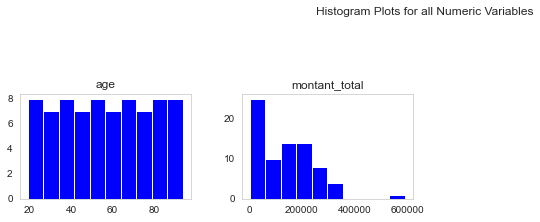

In [174]:
grp_age_mont_total.hist(layout=(5,4),color='blue', figsize=(15,12), grid=False)
plt.suptitle("Histogram Plots for all Numeric Variables")

 Le graphique le plus adapté dans le cas de deux variables quantitatives est un diagramme de dispersion, qui n'est autre qu'un nuage de points (ou scatter plot, en anglais).

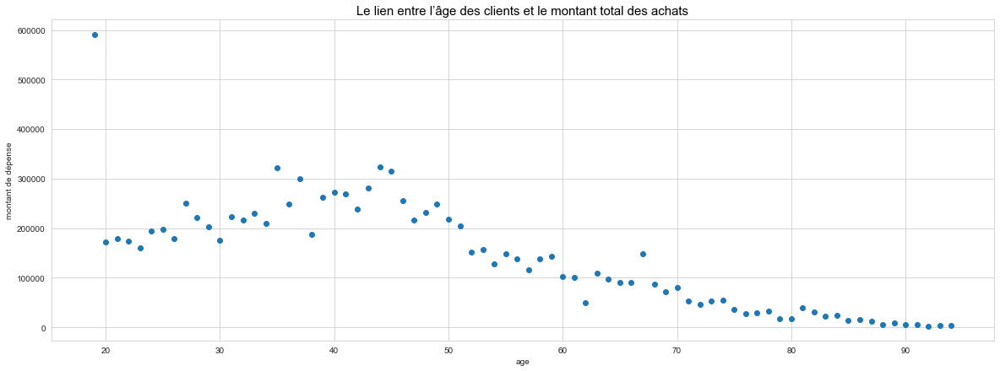

In [175]:

plt.figure(figsize=[20,7])
plt.plot(grp_age_mont_total["age"],grp_age_mont_total["montant_total"],'o')
plt.xlabel("age")
plt.ylabel("montant de dépense")
font1 = {'color':'black','size':15}
plt.title("Le lien entre l’âge des clients et le montant total des achats",fontdict=font1)
#plt.savefig("P6_image/age_montant_total.png")
plt.show()

# Spearman’s Rank Correlation Test (non paramétrique)

In [176]:
# il n y a pas distrubution normal alors on va choisir un test non parametrique
# Correlation de test Spearman

In [177]:
# H0 Pas de corrélation entre deux variables
# H1 Il y a une corrélation entre deux variables

from scipy.stats import spearmanr
# prepare data
data1 = grp_age_mont_total["age"]
data2 = grp_age_mont_total["montant_total"]
# calculate spearman's correlation
coef, p = spearmanr(data1, data2)
print('Spearmans correlation coefficient: %.3f' % coef)
print("p_value=",p)
# interpret the significance
alpha = 0.05
if p > alpha:
    print('Pas de corrélation entre deux variables p=%.3f' % p)
else:
    print('Il y a une corrélation entre deux variables p=%.3f' % p)

Spearmans correlation coefficient: -0.874
p_value= 6.668764227215193e-25
Il y a une corrélation entre deux variables p=0.000


In [178]:
# Il y a une corrélation entre l’âge des clients et le montant total des achats
# plus les consommateurs sont agés le montant total de leur achat est faible

## Régression Linéaire

In [179]:

X = grp_age_mont_total["age"].values
y = grp_age_mont_total["montant_total"].values

In [180]:
# Création du modèle
X_sm =  sm.add_constant(X)
model = sm.OLS(y, X_sm).fit()

# calcul de R2 et de la p-valeur
rsquare = model.rsquared
pval = model.pvalues[0]

R-carré= 0.6905662642124327  p-valeur= 0.0


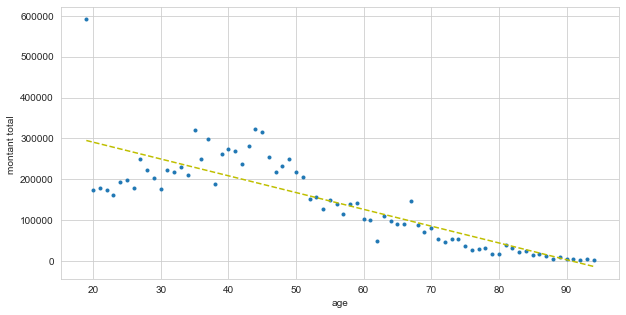

In [181]:
plt.figure(figsize=(10,5))
plt.plot(X, y, '.')
plt.plot(X, model.predict(X_sm), 'y--')
plt.xlabel('age')
plt.ylabel("montant total ")
print("R-carré=",rsquare," p-valeur=",round(pval,2))

# Analysez une variable quantitative et une qualitative par ANOVA


## Le lien entre catégorie d’âge des clients et le montant total des achats

In [182]:
cat_age_mont_total=trans_clients_particul.groupby("cat_age")["price"].sum().reset_index()
cat_age_mont_total.rename(columns={"price":"montant_total"},inplace=True)
cat_age_mont_total

,cat_age,montant_total
0,adult 30-45,2699677.43
1,jeune <25,1669296.02
2,jeune-adult 25-30,2229634.77
3,moyen-age 45-60,2596625.29
4,senior >60,1483140.93


In [183]:
grp_age_mont_total["cat_age"]=pd.cut(x=grp_age_mont_total['age'], bins=[-np.inf, 24,35,45,60, np.inf], labels=["jeune <25","jeune-adult 25-30", "adult 30-45", "moyen-age 45-60", "senior >60"])

In [184]:
grp_age_mont_total.head()

,age,montant_total,cat_age
0,19,591414.23,jeune <25
1,20,172831.75,jeune <25
2,21,178802.38,jeune <25
3,22,174347.66,jeune <25
4,23,160578.67,jeune <25


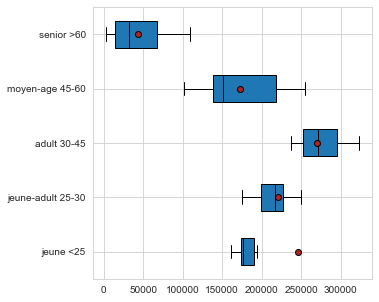

In [185]:
X1 = "cat_age" # qualitative
Y1 = "montant_total" # quantitative

modalites = grp_age_mont_total[X1].unique()
groupes = []
for m in modalites:
    groupes.append(grp_age_mont_total[grp_age_mont_total[X1]==m][Y1])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

In [186]:
# Les points rouges au milieu de chaque boîte à moustaches représentent la moyenne des valeurs.

η2Y/X=Vinterclasses/Vtotale

Si  η2Y/X=0  , cela signifie que les moyennes par classes sont toutes égales. Il n’y a donc pas à priori de relation entre les variables Y et X. Au contraire, si η2Y/X=1 , cela signifie que les moyennes par classes sont très différentes, chacune des classes étant constituée de valeurs identiques : il existe donc à priori une relation entre les variables Y et X.

In [187]:
X2 = "cat_age" # qualitative
Y2 = "montant_total" # quantitative

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
    
eta_squared(grp_age_mont_total[X2],grp_age_mont_total[Y2])


0.7134947719831298

In [188]:
# Il y a une corrélation entre catégorie d’âge des clients et le montant total des achats

## TEST KRUSKAL WALLIS (non paramétrique)

In [189]:
from scipy import stats
categ_1=grp_age_mont_total[grp_age_mont_total["cat_age"]=='jeune <25']["montant_total"]
categ_2=grp_age_mont_total[grp_age_mont_total["cat_age"]=='jeune-adult 25-30']["montant_total"]
categ_3=grp_age_mont_total[grp_age_mont_total["cat_age"]=='adult 30-45']["montant_total"]
categ_4=grp_age_mont_total[grp_age_mont_total["cat_age"]=='moyen-age 45-60']["montant_total"]
categ_5=grp_age_mont_total[grp_age_mont_total["cat_age"]=='senior >60']["montant_total"]

stats.kruskal(categ_1,categ_2,categ_3,categ_4,categ_5)

KruskalResult(statistic=59.98201446737892, pvalue=2.926218442265258e-12)

In [190]:
# Il y a une corrélation entre catégorie d’âge des clients et le montant total des achats

# <a name="C11"> 3.3 Le lien entre l’âge des clients et la fréquence d’achat</a>
<a href="#top">sommaire</a>

In [191]:
trans_clients_particul.head()

,client_id,sex,birth,age,cat_age,id_prod,price,categ,session_id,date_jour,date_mois
0,c_4410,f,1967,56,moyen-age 45-60,1_385,25.99,1,s_9707,2021-03-22,2021-03-01
1,c_4410,f,1967,56,moyen-age 45-60,1_385,25.99,1,s_345108,2023-02-22,2023-02-01
2,c_4410,f,1967,56,moyen-age 45-60,0_1110,4.71,0,s_114715,2021-11-04,2021-11-01
3,c_4410,f,1967,56,moyen-age 45-60,0_1111,19.99,0,s_345108,2023-02-22,2023-02-01
4,c_4410,f,1967,56,moyen-age 45-60,0_1111,19.99,0,s_9707,2021-03-22,2021-03-01


In [192]:
age_session=trans_clients_particul.groupby(by="age")["session_id"].nunique().reset_index()
age_session.head()

,age,session_id
0,19,8341
1,20,2484
2,21,2527
3,22,2371
4,23,2358


In [193]:
# On va calculer nombre d'achat par mois 

In [194]:
# On calcule le nombre de mois
nombre_mois=trans_clients_particul["date_mois"].nunique()
nombre_mois

23

In [195]:
age_session["nb_achat_mois"]=age_session["session_id"]/nombre_mois
age_session.head()

,age,session_id,nb_achat_mois
0,19,8341,362.652174
1,20,2484,108.000000
2,21,2527,109.869565
3,22,2371,103.086957
4,23,2358,102.521739


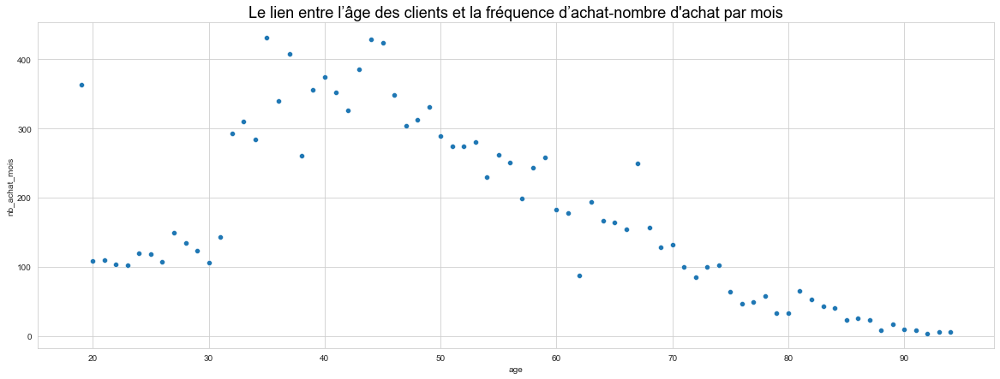

In [196]:
plt.figure(figsize=[20,7])
font1 = {'color':'black','size':18}
plt.title("Le lien entre l’âge des clients et la fréquence d’achat-nombre d'achat par mois",fontdict=font1)
sns.scatterplot(data=age_session, x="age", y="nb_achat_mois");

# Spearman’s Rank Correlation Test

In [197]:
# H0 Pas de corrélation entre deux variables
# H1 Corrélation entre deux variables


from scipy.stats import spearmanr

# prepare data
data7 = age_session["age"]
data8 = age_session["nb_achat_mois"]
# calculate spearman's correlation
coef, p = spearmanr(data7, data8)
print('Spearmans correlation coefficient: %.3f' % coef)
print("p_value=",p)
# interpret the significance
alpha = 0.05
if p > alpha:
    print('Samples are uncorrelated (fail to reject H0) p=%.3f' % p)
else:
    print('Samples are correlated (reject H0) p=%.3f' % p)

Spearmans correlation coefficient: -0.659
p_value= 9.775216147916007e-11
Samples are correlated (reject H0) p=0.000


In [198]:
# il y a une corrélation entre l’âge des clients et la fréquence d’achat
# Les clients qui ont l'âge entre 30 et 50 achètent plus fréquemment

## Régression Linéaire

In [199]:
X = age_session["age"].values
y = age_session["nb_achat_mois"].values

In [200]:
# Création du modèle
X_sm =  sm.add_constant(X)
model = sm.OLS(y, X_sm).fit()

# calcul de R2 et de la p-valeur
rsquare = model.rsquared
pval = model.pvalues[0]

R-carré= 0.3622246424304191  p-valeur= 0.0


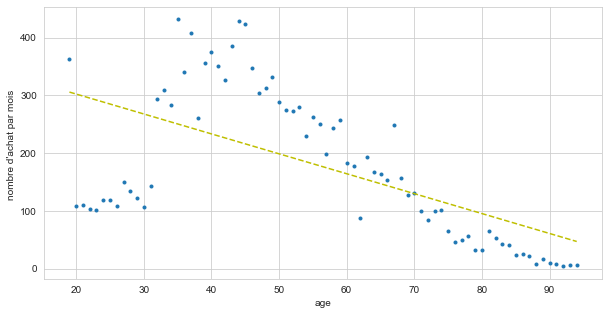

In [201]:
plt.figure(figsize=(10,5))
plt.plot(X, y, '.')
plt.plot(X, model.predict(X_sm), 'y--')
plt.xlabel('age')
plt.ylabel("nombre d'achat par mois ")
print("R-carré=",rsquare," p-valeur=",round(pval,2))

# <a name="C12"> 3.4 Le lien entre l’âge des clients et la taille du panier moyen</a>
<a href="#top">sommaire</a>

In [202]:
# On calcule le panier moyen par client et par session
a=trans_clients_particul.groupby(by=["client_id","session_id"])["price"].mean().reset_index()
a.head()

,client_id,session_id,price
0,c_1,s_114737,18.524
1,c_1,s_120172,22.145
2,c_1,s_134971,10.300
3,c_1,s_136532,13.780
4,c_1,s_139610,16.990


In [203]:
# on calcule le panier moyen par client

b=a.groupby("client_id")["price"].mean().reset_index()
b.head()

,client_id,price
0,c_1,13.493875
1,c_10,23.119382
2,c_100,28.403333
3,c_1000,17.779707
4,c_1001,15.529716


In [204]:
# on obtient les informations d'age pour les clients avec un merge

c=pd.merge(b,customers_new,on="client_id",how="inner")
c.head()

,client_id,price,sex,birth,age,cat_age
0,c_1,13.493875,m,1955,68,senior >60
1,c_10,23.119382,m,1956,67,senior >60
2,c_100,28.403333,m,1992,31,jeune-adult 25-30
3,c_1000,17.779707,f,1966,57,moyen-age 45-60
4,c_1001,15.529716,m,1982,41,adult 30-45


In [205]:
# on calcule le panier moyen par age

d=c.groupby("age")["price"].mean().reset_index()
d.rename(columns={"price":"panier_moyen"},inplace=True)
d.head()

,age,panier_moyen
0,19,45.549382
1,20,48.828490
2,21,45.309387
3,22,50.142510
4,23,43.680565


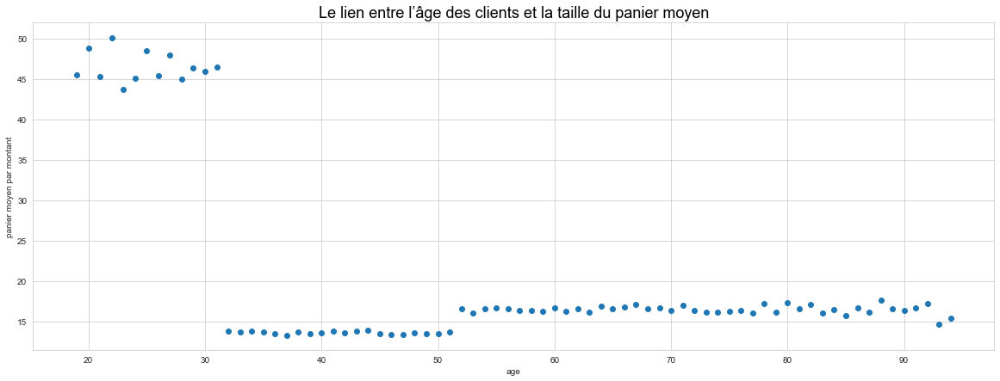

In [206]:
plt.figure(figsize=[20,7])
plt.plot(d["age"],d["panier_moyen"],'o')
plt.xlabel("age")
plt.ylabel("panier moyen par montant")
font1 = {'color':'black','size':18}
plt.title("Le lien entre l’âge des clients et la taille du panier moyen",fontdict=font1)
plt.show()


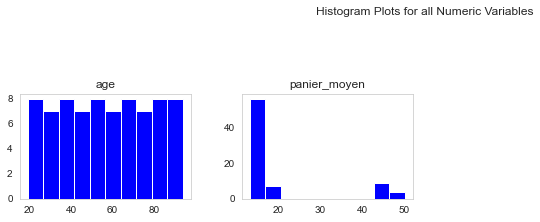

In [207]:
d.hist(layout=(5,4),color='blue', figsize=(15,12), grid=False)
plt.suptitle("Histogram Plots for all Numeric Variables");


In [208]:

# test shapiro pour normalité

# H0 distribution normal
# H1 distribution pas normal

columns1=d.columns
for i in columns1:
    print ([i])
    a,b= stats.shapiro(d[[i]])
    print ("Statistics", a, "p-value", b)
    if b < alpha:  
        print("The null hypothesis can be rejected")
    else:
        print("The null hypothesis cannot be rejected")



['age']
Statistics 0.9549235701560974 p-value 0.008753503672778606
The null hypothesis can be rejected
['panier_moyen']
Statistics 0.565576434135437 p-value 1.1868952272831718e-13
The null hypothesis can be rejected


# Spearman’s Rank Correlation Test

In [209]:
# H0 Pas de corrélation entre deux variables
# H1 Corrélation entre deux variables


from scipy.stats import spearmanr

# prepare data
data3 = d["age"]
data4 = d["panier_moyen"]
# calculate spearman's correlation
coef, p = spearmanr(data3, data4)
print('Spearmans correlation coefficient: %.3f' % coef)
print("p_value=",p)
# interpret the significance
alpha = 0.05

Spearmans correlation coefficient: -0.067
p_value= 0.5639041621739129


In [210]:
# p_value > 0.05 Pas de corrélation entre l’âge des clients et la taille du panier moyen
# Par contre on constate trois type de dispersion par âge

# <a name="C13"> 3.5 Le lien entre l’âge des clients et les catégories des livres achetés</a>

<a href="#top">sommaire</a>
 

## Analyse d'une variable quantitative et une qualitative par ANOVA

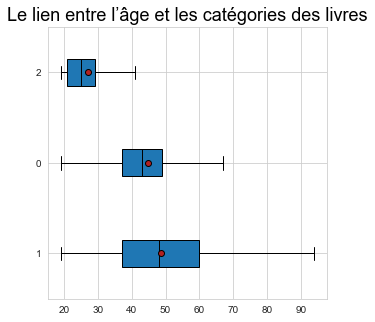

In [211]:
X3 = "categ" # qualitative
Y3 = "age" # quantitative


modalites = trans_clients_particul[X3].unique()
groupes = []
for m in modalites:
    groupes.append(trans_clients_particul[trans_clients_particul[X3]==m][Y3])

# Propriétés graphiques (pas très importantes)    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)

plt.title("Le lien entre l’âge et les catégories des livres",fontdict=font1)
plt.show()

In [212]:
# Les points rouges au milieu de chaque boîte à moustaches représentent la moyenne des valeurs.

In [213]:
X3 = "categ" # qualitative
Y3 = "age" # quantitative


def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
    
eta_squared(trans_clients_particul[X3],trans_clients_particul[Y3])


0.11313227712749609

### TEST KRUSKAL WALLIS (non parametrique)

In [214]:
# H0 Pas de corrélation entre deux variables
# H1 Corrélation entre deux variables

categ_0=trans_clients_particul[trans_clients_particul["categ"]==0]["age"]
categ_1=trans_clients_particul[trans_clients_particul["categ"]==1]["age"]
categ_2=trans_clients_particul[trans_clients_particul["categ"]==2]["age"]

stats.kruskal(categ_1,categ_2,categ_3,categ_4,categ_5)


KruskalResult(statistic=50193.41337631088, pvalue=0.0)

In [215]:
# On rejette H0 donc il y a une corrélation entre l’âge des clients et les catégories des livres achetés.

### Catégorie age qualitative et catégorie livre qualitative

In [216]:
X4="cat_age"
Y4="categ"

my_crosstab=pd.crosstab(trans_clients_particul[X4],trans_clients_particul[Y4])
my_crosstab

categ,0,1,2
cat_age,,,
adult 30-45,152382,49413,744
jeune <25,9154,15905,16490
jeune-adult 25-30,62379,29352,12735
moyen-age 45-60,108523,66479,996
senior >60,37631,49628,815


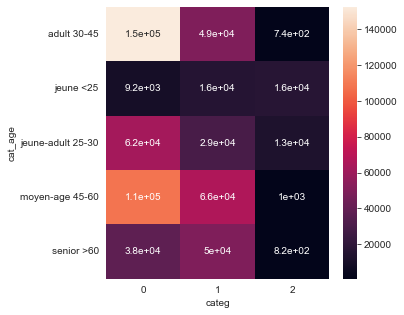

In [217]:
sns.heatmap(my_crosstab,annot=True);

## Le test CHI 2

In [218]:
# H0= ils sont indépendentes age et categ
# H1 Corrélation entre deux variables
from scipy.stats import chi2_contingency
obs = my_crosstab
chi2_contingency(obs)

(166919.81610840117,
 0.0,
 8,
 array([[122347.7377568 ,  69684.54293974,  10506.71930346],
        [ 25098.50525606,  14295.13858863,   2155.35615531],
        [ 63104.77869695,  35942.04307685,   5419.17822619],
        [106315.11535913,  60552.98084965,   9129.90379122],
        [ 53202.86293105,  30302.29454512,   4568.84252382]]))

In [219]:
# p< 0.05 on rejette H0
# ils sont corrélés

# Une analyse supplémentaire

 # <a name="C14"> Le lien entre le genre d’un client et la taille du panier moyen</a>
 <a href="#top">sommaire</a>

In [220]:
trans_clients_particul.head()

,client_id,sex,birth,age,cat_age,id_prod,price,categ,session_id,date_jour,date_mois
0,c_4410,f,1967,56,moyen-age 45-60,1_385,25.99,1,s_9707,2021-03-22,2021-03-01
1,c_4410,f,1967,56,moyen-age 45-60,1_385,25.99,1,s_345108,2023-02-22,2023-02-01
2,c_4410,f,1967,56,moyen-age 45-60,0_1110,4.71,0,s_114715,2021-11-04,2021-11-01
3,c_4410,f,1967,56,moyen-age 45-60,0_1111,19.99,0,s_345108,2023-02-22,2023-02-01
4,c_4410,f,1967,56,moyen-age 45-60,0_1111,19.99,0,s_9707,2021-03-22,2021-03-01


In [221]:
#c=pd.merge(b,customers_new,on="client_id",how="inner")
# c= le calcule panier moyen par client et on obtient les informations age et sex avec un merge
c.head()

,client_id,price,sex,birth,age,cat_age
0,c_1,13.493875,m,1955,68,senior >60
1,c_10,23.119382,m,1956,67,senior >60
2,c_100,28.403333,m,1992,31,jeune-adult 25-30
3,c_1000,17.779707,f,1966,57,moyen-age 45-60
4,c_1001,15.529716,m,1982,41,adult 30-45


In [222]:
# on calcule panier moyen par sex
c.groupby("sex")["price"].mean()

sex
f    23.260702
m    23.202377
Name: price, dtype: float64

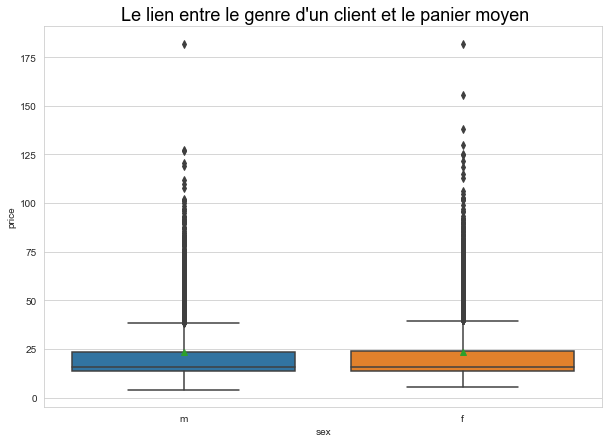

In [223]:
plt.figure(figsize=[10,7])
ax = sns.boxplot(x="sex", y="price", data=c,showmeans=True)
font1 = {'color':'black','size':18}
plt.title(" Le lien entre le genre d'un client et le panier moyen",fontdict=font1);


In [224]:
panier_moyen_sex=c

In [225]:
panier_femme=panier_moyen_sex[panier_moyen_sex["sex"]=="f"]["price"]
panier_homme=panier_moyen_sex[panier_moyen_sex["sex"]=="m"]["price"]

In [226]:
# test distribution normal
import numpy as np
import scipy.stats as stat

sp = stat.shapiro(panier_moyen_sex["price"])
print(sp) 

ShapiroResult(statistic=0.6899304389953613, pvalue=0.0)


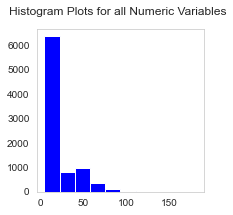

In [227]:
panier_moyen_sex["price"].hist(color='blue', figsize=(3,3), grid=False)
plt.suptitle("Histogram Plots for all Numeric Variables");

In [228]:
panier_femme.mean()

23.2607022315779

In [229]:
panier_homme.mean()

23.202377298001338

# Test de Mann-Whitney - non paramétrique 

In [230]:
# H0= il n'y a pas de différence de panier_moyen entre les clients femmes et hommes
# H1= il y a une différence de panier_moyen entre les clients femmes et hommes

In [231]:
#test de Mann-Whitney - non paramétrique - avec correction de continuité
print(stat.mannwhitneyu(panier_femme,panier_homme))

MannwhitneyuResult(statistic=9202871.5, pvalue=0.9084555743182589)


In [232]:
# p_value>0.05 On ne peut pas rejeter H0. 
#Donc il n'y a pas de différence de panier_moyen entre les clients femmes et hommes

#  <a name="C15">Conclusion </a>

 <a href="#top">sommaire</a>


* On devrait trouver la raison de saut de date sur le fichier transactions et remédier ce problème pour que ne répète pas encore.
* On devrait s’interroger les raisons de changement de ca pour certaines catégories.
* On devrait essayer de fidéliser les clients qui génèrent plus de ca.
* On devrait essayer augmenter le panier moyen des clients et leur fréquence d’achat.
